# 파이썬 머신러닝 스터디
## [파이썬 완벽가이드 4단원_분류]

### 01. 분류(Classification)의 개요

지도학습은 레이블(Label), 즉 명시적인 정답이 있는 데이터가 주어진 상태에서 학습하는 머신러닝 방식이다. 지도학습의 대표적인 유형인 분류(Classification)는 학습 데이터로 주어진 데이터의 피처와 레이블값(결정 값, 클래스 값)을 머신러닝 알고리즘으로 학습해 모델을 생성하고, 이렇게 생성된 모델에 새로운 데이터 값이 주어졌을 때 미지의 레이블 값을 예측하는 것.<br>
즉, 기존 데이터가 어떤 레이블에 속하는지 패턴을 알고리즘으로 인지한 뒤에 새롭게 관측된 데이터에 대한 레이블을 판별하는 것
* 분류를 구현하는 머신러닝 알고리즘
> * 베이즈(Bayes) 통계와 생성 모델에 기반한 나이브 베이즈(Naive Bayes)
> * 독립변수와 종속변수의 선형 관계성에 기반한 로지스틱 회귀(Logistic Regression)
> * 데이터 균일도에 따른 규칙 기반의 결정 트리(Decision Tree)
> *  개별 클래스 간의 최대 분류 마진을 효과적으로 찾아주는 서포트 벡터 머신(Support Vector Machine)
>* 근접 거리를 기준으로 하는 최소 근접(Nearest Neighbor) 알고리즘
>* 심층 연결 기반의 신경망(Neural Network)
>* 서로 다른(또는 같은) 머신러닝 알고리즘을 결합한 앙상블(Ensemble)

-->이 단원에서는 다양한 알고리즘 중에서 *앙상블 방법(Ensemble Method)*을 집중적으로 다룰것!  앙상블은 분류에서 가장 각광을 받는 방법 중 하나. 물론 이미지, 영상, 음성, NLP 영역에서 신경망에 기반한 딥러닝이 머신러닝계를 선도하고 있지만, 이를 제외한 정형 데이터의 예측 분석 영역에서는 앙상블이 매우 높은 예측 성능으로 인해 많은 분석가와 데이터 과학자들에게 애용되고 있다.

앙상블은 서로 다른/또는 같은 알고리즘을 단순히 결합한 형태도 있으나, 일반적으로는 배깅
(Bagging)과 부스팅(Boosting) 방식으로 나뉜다. 배깅 방식의 대표인 랜덤 포레스트(Random Forest)는 뛰어난 예측 성능, 상대적으로 빠른 수행 시간, 유연성 등으로 많은 분석가가 애용하는 알고리즘이지만 근래의 앙상블 방법은 부스팅 방식으로 지속해서 발전하고 있다. <br>
부스팅의 효시라고 할 수 있는 그래디언트 부스팅(Gradient Boosting)의 경우 뛰어난 예측 성능을 가지고 있지만, 수행 시간이 너무 오래 걸리는 단점으로 인해 최적화 모델 튜닝이 어려웠다. 하지만
XgBoost(eXtra Gradient Boost)와 LightGBM 등 기존 그래디 언트 부스팅의 예측 성능을 한 단계
발전시키면서도 수행 시간을 단축시킨 알고리즘이 계속 등장하면서 정형 데이터의 분류 영역에서 가장 활용도가 높은 알고리즘으로 자리 잡았다.


### 02. 결정트리

결정 트리(Decision Tree)는 ML 알고리즘 중 직관적으로 이해하기 쉬운 알고리즘. 데이터에
있는 규칙을 학습을 통해 자동으로 찾아내 트리(Tree) 기반의 분류 규칙을 만드는 것. 데이터의 어떤 기준을 바탕으로 규칙을 만들어
야 가장 효율적인 분류가 될 것인가가 알고리즘의 성능을 크게 좌우한다.<br>
규칙 노드(Decision Node)로 표시된 노드는 규칙 조건이 되는 것이고, 리프 노드(Leaf Node)로 표시된 노드는 결정된 클래스 값. 그리
고 새로운 규칙 조건마다 서브 트리(Sub Tree)가 생성됨. 데이터 세트에 피처가 있고 이러한 피처
가 결합해 규칙 조건을 만들 때마다 규칙 노드가 만들어지지만 많은 규칙이 있다는 것은 곧 분
류를 결정하는 방식이 더욱 복잡해진다는 얘기이고, 이는 곧 과적합으로 이어지기 쉽다. 즉, 트리
의 깊이(depth)가 깊어질수록 결정 트리의 예측 성능이 저하될 가능성이 높다.
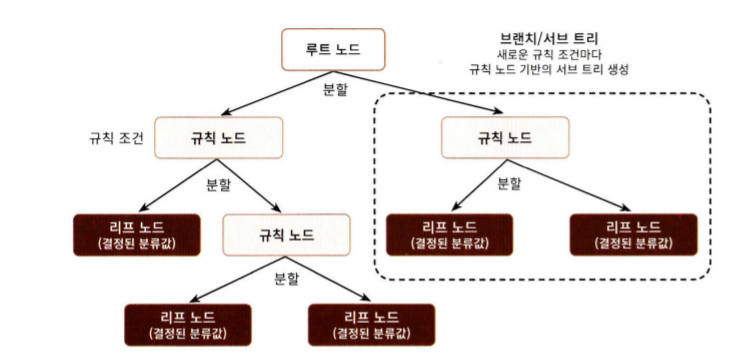
가능한 한 적은 결정 노드로 높은 예측 정확도를 가지려면 데이터를 분류할 때 최대한 많은 데이터 세트가 해당 분류에 속할 수 있도록 결정 노드의 규칙이 정해져야 함 이를 위해서는 어떻게 트리를
분할(Split)할 것인가가 중요한데 최대한 균일한 데이터 세트를 구성할 수 있도록 분할하는 것이 필요

=>결정 노드는 정보 균일도가 높은 데이터 세트를 먼저 선택할 수 있도록 규칙 조건을 만든다. 즉, 정보
균일도가 데이터 세트로 쪼개질 수 있도록 조건을 찾아 서브 데이터 세트를 만들고. 다시 이 서브 데이터 세트에서 균일도가 높은 자식 데이터 세트 쪼개는 방식을 자식 트리로 내려가면서 반복하는 방식으
로 데이터 값을 예측하게 됨
* 정보의 균일도를 측정하는 대표적 방법
> * 정보이득(Information Gain) 계수
>>정보 이득은 엔트로피라는 개념을 기반으로. 엔트로피는 주어진 데이터 집합의 혼잡도를 의미하는데, 서로 다른 값이 섞여 있으면 엔트로피가 높고. 같은 값이 섞여 있으면 엔트로피가 낮다. 정보 이득 지수는 1에서 엔트로피 지수를 뺀 값이다. 즉, 1 -엔트로피 지수입니다. 결정 트리는 이 정보 이득 지수로 분할 기준을 정함. 즉, 정보 이득이 높은
속성을 기준으로 분할.
> * 지니계수
>>지니 계수는 원래 경제학에서 불평등 지수를 나타낼 때 사용하는 계수. 0이 가장 평등하고 1로 갈수록 불평등. 머신러닝에 적용될 때는 지니 계수가 낮을수록 데이터
균일도가 높은 것으로 해석해 지니 계수가 낮은 속성을 기준으로 분할

결정 트리 알고리즘을 사이킷런에서 구현한 DecisionTreeClassifier는 기본으로 지니 계수를 이용해
데이터 세트를 분할. 결정 트리의 일반적인 알고리즘은 데이터 세트를 분할하는 데 가장 좋은 조건, 즉 정보 이득이 높거나 지니 계수가 낮은 조건을 찾아서 자식 트리 노드에 걸쳐 반복적으로 분할한
뒤, 데이터가 모두 특정 분류에 속하게 되면 분할을 멈추고 분류를 결정
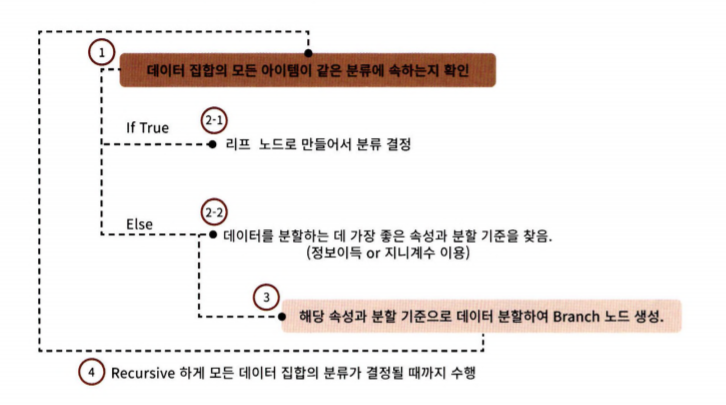

***결정 트리 모델의 특징***
* 장점
> * 정보의 ‘균일도’라는 룰을 기반으로 하고 있어서 알고리즘이 쉽고 직관적
> * 정보의 균일도만 신경 쓰면 되므로 특별한
경우를 제외하고는 각 피처의 스케일링과 정규화 같은 전처리 작업이 필요 없다.
* 단점
> * 과적합으로 정확도가 떨어진다
: 피처 정보의 균일도에 따른 룰 규칙으로 서브 트리를 계속 만들다 보면 피처가 많고 균일도가 다양하게 존재할수록 트리의 깊이가 커지고
복잡해질 수밖에 없다.<br>
=> 차라리 모든 데이터 상황을 만족하는 완벽한 규칙은 만들 수 없다고 먼저 인정하는 편이 더 나은 성능을 보장할 수 있다. 즉, 트리의 크기를 사전에 제한하는 것이 오히려 성능 튜닝에 더 도움이 된다.


***결정 트리 파라미터***
사이킷런은 결정 트리 알고리즘을 구현한 DecisionTreeClassifier와 DecisionTreeRegressor 클래스를 제공. DecisionTreeClassifier는 분류를 위한 클래스이며. DecisionTreeRegressor는 회귀
를 위한 클래스. 사이킷런의 결정 트리 구현은 CART(Classification And Regression Trees)
알고리즘 기반. CART는 분류뿐만 아니라 회귀에서도 사용될 수 있는 트리 알고리즘.<br>
여기서는 분류를 위한 DecisionTreeClassifier 클래스만 다룰것. DecisionTreeClassifier와
DecisionTreeRegressor 모두 파라미터는 다음과 같이 동일한 파라미터를 사용
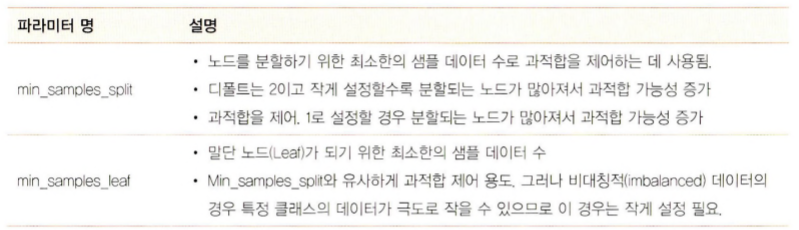
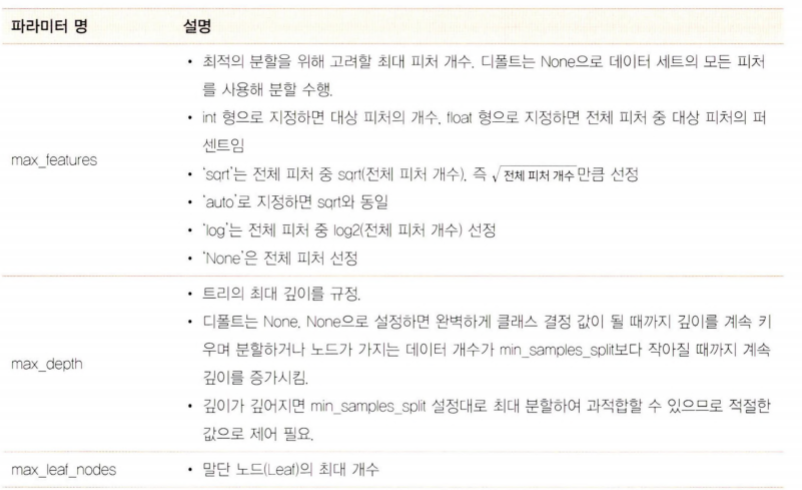

In [1]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# DecisionTree Classifier 생성
dt_clf = DecisionTreeClassifier(random_state=156)

# 붓꽃 데이터를 로딩하고, 학습과 테스트 데이터 셋으로 분리
iris_data = load_iris()
X_train , X_test , y_train , y_test = train_test_split(iris_data.data, iris_data.target,
                                                       test_size=0.2,  random_state=11)

# DecisionTreeClassifer 학습. 
dt_clf.fit(X_train , y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=156,
            splitter='best')

In [2]:
# 사이킷런의 트리 모듈은 Graphviz를 이용하기 위해 export_graphviz( ) 함수를 제공
from sklearn.tree import export_graphviz

# export_graphviz()의 호출 결과로 out_file로 지정된 tree.dot 파일을 생성함. 
export_graphviz(dt_clf, out_file="tree.dot", class_names=iris_data.target_names , \
feature_names = iris_data.feature_names, impurity=True, filled=True)

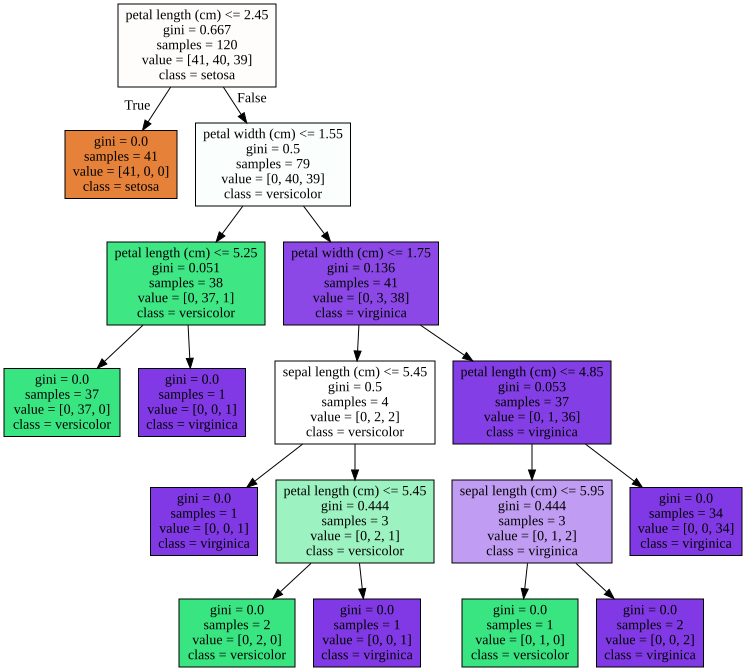

In [3]:
import graphviz

# 위에서 생성된 tree.dot 파일을 Graphviz 읽어서 Jupyter Notebook상에서 시각화 
with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

=> 
* 먼저 더 이상 자식 노드가 없는 노드는 리프 노드. 리프 노드는 최종 클래스(레이블) 값이 결정되는 노드. 리프 노드가 되려면 오직 하나의 클래스 값으로 최종 데이터가 구성되거나 리프 노드가 될 수 있는 하이퍼 파라미터 조건을 충족하면 된다. 
* 자식 노드가 있는 노드는 브랜치 노드이며 자식 노드를 만들기 위한 분할 규칙 조건을 가지고 있다. 위 그림에서 노드 내에 기술된 지표의 의미는 다음과 같습니다.
> * petal length(cm) <= 2.45와 같이 피처의 조건이 있는 것은 자식 노드를 만들기 위한 규칙 조건. 이 조건이 없으면
리프 노드.
> *  gini는 다음의 value=()로 주어진 데이터 분포에서의 지니 계수.
> * samples는 현 규칙에 해당하는 데이터 건수.
> * value = ()는 클래스 값 기반의 데이터 건수. 붓꽃 데이터 세트는 클래스 값으로 0, 1, 2를 가지고 있으며, 0 ：
Setosa, 1： Versic이or, 2： Virginica 품종을 가리킨다. 만일 Value = [41, 40, 39]라면 클래스 값의 순서로 Setosa 41개,
Vesicolor 40개, Virginica 39개로 데이터가 구성돼 있다는 의미.

*각 노드의 색깔은 붓꽃 데이터의 레이블 값을 의미. 주황색은 0： Setosa, 초록색은 1： Versicolor, 보라색은 2： Virginica 레이블을 나타낸다. 색깔이 짙어질수록 지니 계수가 낮고 해당
레이블에 속하는 샘플 데이터가 많다는 의미*

==>> 이처럼 Graphviz를 이용하면 결정 트리 알고리즘의 규칙 생성 트리를 시각적으로 이해할 수 있다. 4번 노드를 다시 살펴보면 38개의 샘플 데이터 중 Virginica가 단 1 개이고, 37개가 Versicolor이
지만 Versicolor와 Virginica를 구분하기 위해서 다시 자식 노드를 생성. 이처럼 결정 트리는 규칙 생성 로직을 미리 제어하지 않으면 완벽하게 클래스 값을 구별해내기 위해 트리 노드를 계속해서 만들어 가는데 이로 인해 **결국 매우 복잡한 규칙 트리가 만들어져 모델이 쉽게 과적합되는 문제점을 가지게 됨.** 결정 트리는 이러한 이유로 과적합이 상당히 높은 ML 알고리즘. 이 때문에 결정 트리 알고리즘을 제어하는 대부분 하이퍼 파라미터는 복잡한 트리가 생성되는 것을 막기 위한 용도

***결정 트리의 max_depth 하이퍼 파라미터 변경에 따른 트리 변화***<br>
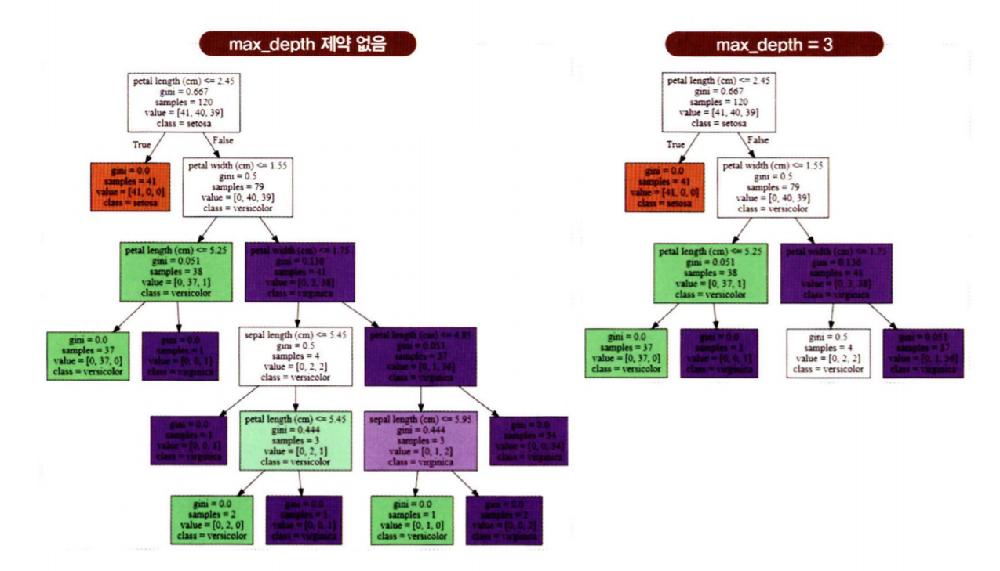


***min_samples_split 하이퍼 파라미터 변경에 따른 규칙 트리의 변화***<br>
(min_samples_splits는 자식 규칙 노드를 분할해 만들기 위한 최소한의 샘플 데이터 개수)
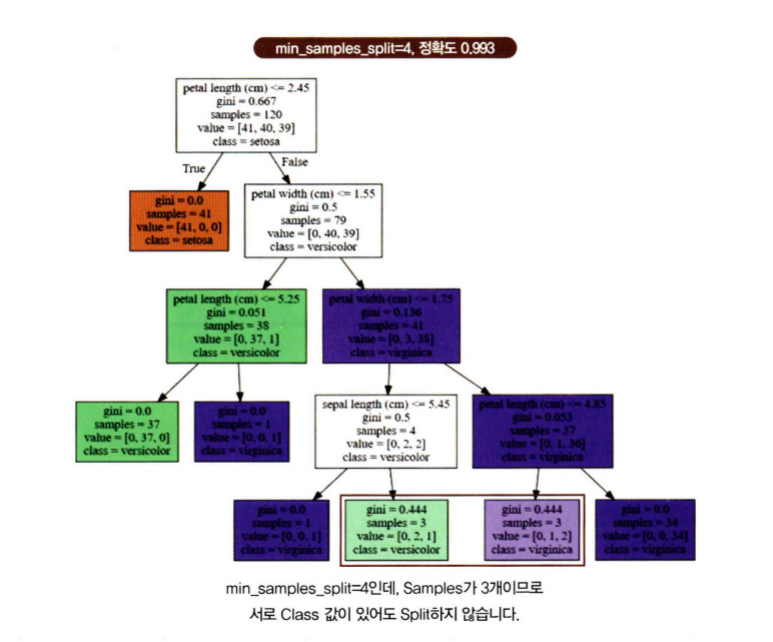
min_samples_splits=4, 즉 자식 노드로 분할하려면 최소한 샘플 개수가 4개는 필요한데, 3개밖에 없으므로 더 이상 자식 규칙 노드를 위한 분할을 하지 않고 리프 노드가 됨. 자연스럽게 트리 깊이도 줄었고 더욱 더 간결한 결정 트리

***min_samples_leaf 하이퍼 파라미터 변경에 따른 결정 트리의 변화***<br>
(더이상 자식 노드가 없는 리프 노드는 클래스 결정 값이 되는데, min_samplesJeaf는 이 리프 노드가 될
수 있는 샘플 데이터 건수의 최솟값을 지정.리프 노드가 될 수 있는 조건은 디폴트로 1 인데, 이
의미는 다른 클래스 값이 하나도 없이 단독 클래스로만 돼 있거나 단 한 개의 데이터로 돼 있을 경우에
는 리프 노드가 될 수 있다는 것)
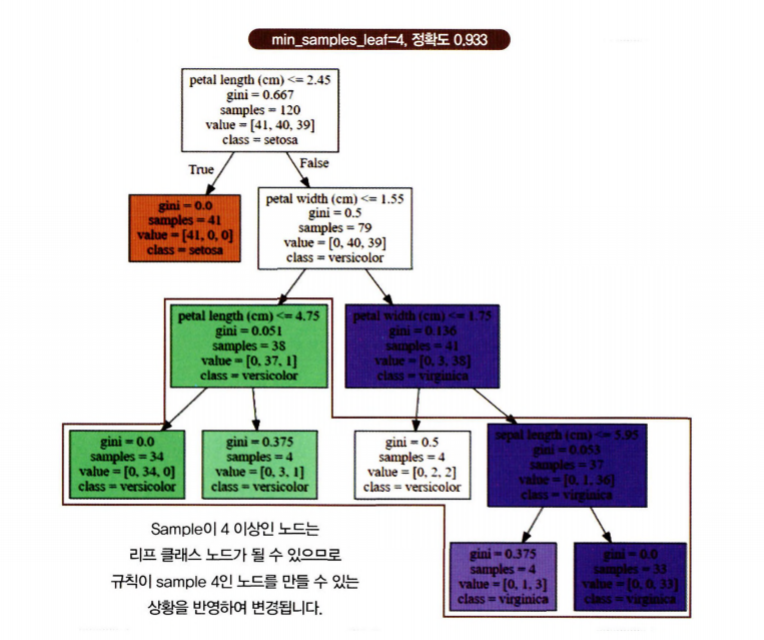
min_samples_leaf의 값을 키우면 더 이상 분할하지 않고, 리프 노드가 될 수 있는 조건이 완화됨. 즉. min_samples_leaf〈= 지정 값 기준만 만족하면 리프 노드가 될 수 있다.
즉. min_samplesjeaf = 4로 설정하면 샘플이 4 이하이면 리프 노드가 되기 때문에 지니 계수 값이 크더라도 샘플이 4인 조건으로 규칙 변경을 선호하게 되어 자연스럽게 브랜치 노드가 줄어들고 결
정 트리가 더 간결


**=> 결정 트리는 균일도에 기반해 어떠한 속성을 규칙 조건으로 선택하느냐가 중요한 요건이다. 중요한
몇 개의 피처가 명확한 규칙 트리를 만드는 데 크게 기여하며. 모델을 좀 더 간결하고 이상치(Outlier)
에 강한 모델을 만들 수 있기 때문**

Feature importances:
[0.025 0.    0.555 0.42 ]
sepal length (cm) : 0.025
sepal width (cm) : 0.000
petal length (cm) : 0.555
petal width (cm) : 0.420


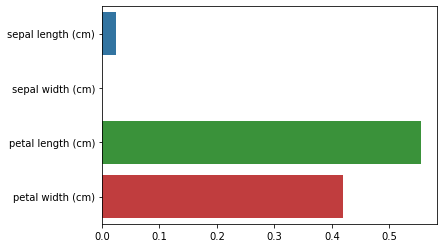

In [4]:
# 사이킷런은 결정 트리 알고리즘이 학습을 통해 규칙을 정하는 데 있어 피처의 중요한 역할 지표를 
# DecisionTreeClassifierr 객체의 feature_importances_ 속성으로 제공
import seaborn as sns
import numpy as np
%matplotlib inline

# feature importance 추출 
print("Feature importances:\n{0}".format(np.round(dt_clf.feature_importances_, 3)))

# feature별 importance 매핑
for name, value in zip(iris_data.feature_names , dt_clf.feature_importances_):
    print('{0} : {1:.3f}'.format(name, value))

# feature importance를 column 별로 시각화 하기 
sns.barplot(x=dt_clf.feature_importances_ , y=iris_data.feature_names)

#여러 피처들 중 petalJength가 가장 피처 중요도가 높음

***결정트리 과적합(Overfitting)***


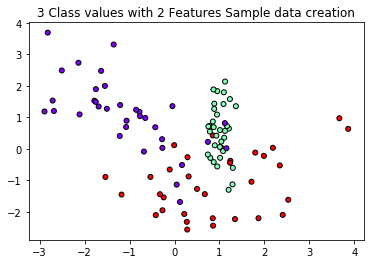

In [5]:
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
%matplotlib inline

plt.title("3 Class values with 2 Features Sample data creation")

# 2차원 시각화를 위해서 feature는 2개, 결정값 클래스는 3가지 유형의 classification 샘플 데이터 생성. 
X_features, y_labels = make_classification(n_features=2, n_redundant=0, n_informative=2,
                             n_classes=3, n_clusters_per_class=1,random_state=0)

# plot 형태로 2개의 feature로 2차원 좌표 시각화, 각 클래스값은 다른 색깔로 표시됨. 
plt.scatter(X_features[:, 0], X_features[:, 1], marker='o', c=y_labels, s=25, cmap='rainbow', edgecolor='k')

In [6]:
import numpy as np

# Classifier의 Decision Boundary를 시각화 하는 함수
def visualize_boundary(model, X, y):
    fig,ax = plt.subplots()
    
    # 학습 데이타 scatter plot으로 나타내기
    ax.scatter(X[:, 0], X[:, 1], c=y, s=25, cmap='rainbow', edgecolor='k',
               clim=(y.min(), y.max()), zorder=3)
    ax.axis('tight')
    ax.axis('off')
    xlim_start , xlim_end = ax.get_xlim()
    ylim_start , ylim_end = ax.get_ylim()
    
    # 호출 파라미터로 들어온 training 데이타로 model 학습 . 
    model.fit(X, y)
    # meshgrid 형태인 모든 좌표값으로 예측 수행. 
    xx, yy = np.meshgrid(np.linspace(xlim_start,xlim_end, num=200),np.linspace(ylim_start,ylim_end, num=200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    
    # contourf() 를 이용하여 class boundary 를 visualization 수행. 
    n_classes = len(np.unique(y))
    contours = ax.contourf(xx, yy, Z, alpha=0.3,
                           levels=np.arange(n_classes + 1) - 0.5,
                           cmap='rainbow', clim=(y.min(), y.max()),
                           zorder=1)

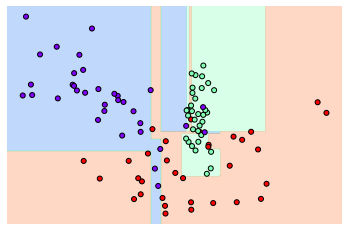

In [7]:
from sklearn.tree import DecisionTreeClassifier

# 특정한 트리 생성 제약없는 결정 트리의 Decsion Boundary 시각화.
dt_clf = DecisionTreeClassifier().fit(X_features, y_labels)
visualize_boundary(dt_clf, X_features, y_labels)


=> 일부 이상치(Outlier) 데이터까지 분류하기 위해 분할이 자주 일어나서 결정 기준 경계가 매우 많아졌다. 결정 트리의 기본 하이퍼 파라미터 설정은 리프 노드 안에 데이터가 모두 균일하거나 하나만
존재해야 하는 엄격한 분할 기준으로 인해 결정 기준 경계가 많아지고 복잡해졌다. 이렇게 복잡한
모델은 학습 데이터 세트의 특성과 약간만 다른 형태의 데이터 세트를 예측하면 예측 정확도가 떨어지게 됨.


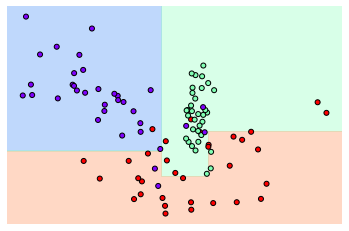

In [8]:
# min_samples_leaf=6 으로 트리 생성 조건을 제약한 Decision Boundary 시각화
dt_clf = DecisionTreeClassifier( min_samples_leaf=6).fit(X_features, y_labels)
visualize_boundary(dt_clf, X_features, y_labels)

***결정 트리 실습 - 사용자 행동 인식 데이터 세트***

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# features.txt 파일에는 피처 이름 index와 피처명이 공백으로 분리되어 있음. 이를 DataFrame으로 로드.
feature_name_df = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\features.txt',sep='\s+',
                        header=None,names=['column_index','column_name'])

# 피처명 index를 제거하고, 피처명만 리스트 객체로 생성한 뒤 샘플로 10개만 추출
feature_name = feature_name_df.iloc[:, 1].values.tolist()
print('전체 피처명에서 10개만 추출:', feature_name[:10])

전체 피처명에서 10개만 추출: ['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z', 'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z', 'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z', 'tBodyAcc-max()-X']


In [10]:
# 중복된 피처명 확인
feature_dup_df = feature_name_df.groupby('column_name').count()
print(feature_dup_df[feature_dup_df['column_index'] > 1].count())
feature_dup_df[feature_dup_df['column_index'] > 1].head()

column_index    42
dtype: int64


,column_index
column_name,
"fBodyAcc-bandsEnergy()-1,16",3
"fBodyAcc-bandsEnergy()-1,24",3
"fBodyAcc-bandsEnergy()-1,8",3
"fBodyAcc-bandsEnergy()-17,24",3
"fBodyAcc-bandsEnergy()-17,32",3


원본 데이터에 중복된 Feature 명으로 인하여 신규 버전의 Pandas에서 Duplicate name 에러를 발생.
중복 feature명에 대해서 원본 feature 명에 '_1(또는2)'를 추가로 부여하는 함수인 get_new_feature_name_df() 생성

In [11]:
def get_new_feature_name_df(old_feature_name_df):
    feature_dup_df = pd.DataFrame(data=old_feature_name_df.groupby('column_name').cumcount(),
                                  columns=['dup_cnt'])
    feature_dup_df = feature_dup_df.reset_index()
    new_feature_name_df = pd.merge(old_feature_name_df.reset_index(), feature_dup_df, how='outer')
    new_feature_name_df['column_name'] = new_feature_name_df[['column_name', 'dup_cnt']].apply(lambda x : x[0]+'_'+str(x[1]) 
                                                                                         if x[1] >0 else x[0] ,  axis=1)
    new_feature_name_df = new_feature_name_df.drop(['index'], axis=1)
    return new_feature_name_df


In [13]:
import pandas as pd

def get_human_dataset( ):
    
    # 각 데이터 파일들은 공백으로 분리되어 있으므로 read_csv에서 공백 문자를 sep으로 할당.
    feature_name_df = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\features.txt',sep='\s+',
                        header=None,names=['column_index','column_name'])
    
    # 중복된 피처명을 수정하는 get_new_feature_name_df()를 이용, 신규 피처명 DataFrame생성. 
    new_feature_name_df = get_new_feature_name_df(feature_name_df)
    
    # DataFrame에 피처명을 컬럼으로 부여하기 위해 리스트 객체로 다시 변환
    feature_name = new_feature_name_df.iloc[:, 1].values.tolist()
    
    # 학습 피처 데이터 셋과 테스트 피처 데이터을 DataFrame으로 로딩. 컬럼명은 feature_name 적용
    X_train = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\train\\X_train.txt',sep='\s+', names=feature_name )
    X_test = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\test\\X_test.txt',sep='\s+', names=feature_name)
    
        # 학습 레이블과 테스트 레이블 데이터을 DataFrame으로 로딩하고 컬럼명은 action으로 부여
    y_train = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\train\\y_train.txt',sep='\s+',header=None,names=['action'])
    y_test = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\test\\y_test.txt',sep='\s+',header=None,names=['action'])
    
    # 로드된 학습/테스트용 DataFrame을 모두 반환 
    return X_train, X_test, y_train, y_test


X_train, X_test, y_train, y_test = get_human_dataset()

In [14]:
print('## 학습 피처 데이터셋 info()')
print(X_train.info())

## 학습 피처 데이터셋 info()
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Columns: 561 entries, tBodyAcc-mean()-X to angle(Z,gravityMean)
dtypes: float64(561)
memory usage: 31.5 MB
None


In [15]:
print(y_train['action'].value_counts())

6    1407
5    1374
4    1286
1    1226
2    1073
3     986
Name: action, dtype: int64


In [16]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# 예제 반복 시 마다 동일한 예측 결과 도출을 위해 random_state 설정
dt_clf = DecisionTreeClassifier(random_state=156)
dt_clf.fit(X_train , y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test , pred)
print('결정 트리 예측 정확도: {0:.4f}'.format(accuracy))

# DecisionTreeClassifier의 하이퍼 파라미터 추출
print('DecisionTreeClassifier 기본 하이퍼 파라미터:\n', dt_clf.get_params())

결정 트리 예측 정확도: 0.8548
DecisionTreeClassifier 기본 하이퍼 파라미터:
 {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'presort': False, 'random_state': 156, 'splitter': 'best'}


In [17]:
from sklearn.model_selection import GridSearchCV

params = {
    'max_depth' : [ 6, 8 ,10, 12, 16 ,20, 24]
}

grid_cv = GridSearchCV(dt_clf, param_grid=params, scoring='accuracy', cv=5, verbose=1 )
grid_cv.fit(X_train , y_train)
print('GridSearchCV 최고 평균 정확도 수치:{0:.4f}'.format(grid_cv.best_score_))
print('GridSearchCV 최적 하이퍼 파라미터:', grid_cv.best_params_)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:  4.0min finished


GridSearchCV 최고 평균 정확도 수치:0.8526
GridSearchCV 최적 하이퍼 파라미터: {'max_depth': 8}


=>max_depth가 8일 때 5개의 폴드 세트의 최고 평균 정확도 결과가 약 85.26%로 도출됨.

이 예제의 수행 목표는 max_depth 값의 증가에 따라 예측 성능이 어떻게 변했는지 확인하는 것이 우선

In [18]:
# GridSearchCV 객체의 cv_results_ 속성은 CV세트에 하이퍼 파라미터를 순차적으로 입력했을 때의 성능 수치를 가지고 있다
# GridSearchCV객체의 cv_results_ 속성을 DataFrame으로 생성. 
cv_results_df = pd.DataFrame(grid_cv.cv_results_)

# max_depth 파라미터 값과 그때의 테스트(Evaluation)셋, 학습 데이터 셋의 정확도 수치 추출
cv_results_df[['param_max_depth', 'mean_test_score']]
# mean_test_score는 5개 CV 세트에서 검증용 데이터 세트의 정확도 평균 수치

,param_max_depth,mean_test_score
0,6,0.850925
1,8,0.852557
2,10,0.850925
3,12,0.844124
4,16,0.852149
5,20,0.851605
6,24,0.850245


=>깊어진 트리는 학습 데이터 세트에는 올바른 예측 결
과를 가져올지 모르지만. 검증 데이터 세트에서는 오히려 과적합으로 인한 성능 저하를 유발

In [19]:
max_depths = [ 6, 8 ,10, 12, 16 ,20, 24]
# max_depth 값을 변화 시키면서 그때마다 학습과 테스트 셋에서의 예측 성능 측정
for depth in max_depths:
    dt_clf = DecisionTreeClassifier(max_depth=depth, random_state=156)
    dt_clf.fit(X_train , y_train)
    pred = dt_clf.predict(X_test)
    accuracy = accuracy_score(y_test , pred)
    print('max_depth = {0} 정확도: {1:.4f}'.format(depth , accuracy))

max_depth = 6 정확도: 0.8558
max_depth = 8 정확도: 0.8707
max_depth = 10 정확도: 0.8673
max_depth = 12 정확도: 0.8646
max_depth = 16 정확도: 0.8575
max_depth = 20 정확도: 0.8548
max_depth = 24 정확도: 0.8548


=> max_depth가 8일 경우 약 87.07%로 가장 높은 정확도를 나타냈습니다. 그리고 max_depth가 8을
넘어가면서 정확도가 계속 감소하고 있습니다. 앞의 GridSearchCV 예제와 마찬가지로 깊이가 깊어질
수록 테스트 데이터 세트의 정확도는 더 떨어집니다. 이처럼 결정 트리는 깊이가 깊어질수록 과적합의
영향력이 커지므로 하이퍼 파라미터를 이용해 깊이를 제어할 수 있어야 합니다. 복잡한 모델보다도 트
리 깊이를 낮춘 단순한 모델이 더욱 효과적인 결과를 가져올 수 있습니다.


In [20]:
## max_depth와 min_samples_split을 같이 변경하면서 정확도 성능을 튜닝
params = {
    'max_depth' : [ 8 , 12, 16 ,20], 
    'min_samples_split' : [16,24],
}

grid_cv = GridSearchCV(dt_clf, param_grid=params, scoring='accuracy', cv=5, verbose=1 )
grid_cv.fit(X_train , y_train)
print('GridSearchCV 최고 평균 정확도 수치: {0:.4f}'.format(grid_cv.best_score_))
print('GridSearchCV 최적 하이퍼 파라미터:', grid_cv.best_params_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:  4.7min finished


GridSearchCV 최고 평균 정확도 수치: 0.8550
GridSearchCV 최적 하이퍼 파라미터: {'max_depth': 8, 'min_samples_split': 16}


In [21]:
# 별도 분리된 테스트 데이터 세트에 해당 하이퍼 파라미터를 적용
# 앞 예제의 GridSearchCV 객체인 grid_cv의 속성 인 best_estimator_는 최적 하이퍼 파라미터 인 max_depth 8, 
# min_samples_split 16으로 학습이 완료된 Estimator 객체
# 이를 이용해 테스트 데이터 세트에 예측을 수행
best_df_clf = grid_cv.best_estimator_
pred1 = best_df_clf.predict(X_test)
accuracy = accuracy_score(y_test , pred1)
print('결정 트리 예측 정확도:{0:.4f}'.format(accuracy))

결정 트리 예측 정확도:0.8717


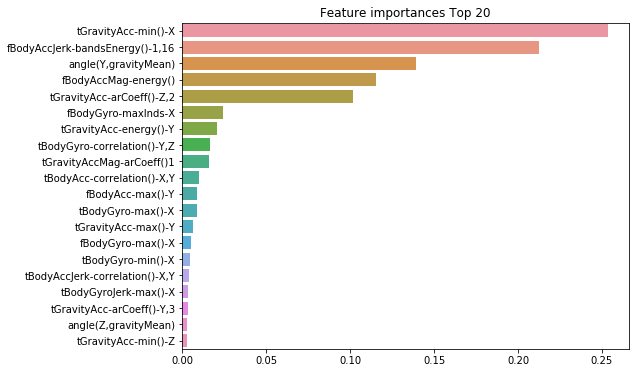

In [22]:
import seaborn as sns

ftr_importances_values = best_df_clf.feature_importances_
# Top 중요도로 정렬을 쉽게 하고, 시본(Seaborn)의 막대그래프로 쉽게 표현하기 위해 Series변환
ftr_importances = pd.Series(ftr_importances_values, index=X_train.columns  )
# 중요도값 순으로 Series를 정렬
ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]
plt.figure(figsize=(8,6))
plt.title('Feature importances Top 20')
sns.barplot(x=ftr_top20 , y = ftr_top20.index)
plt.show()

=> 막대 그래프상에서 확인해 보면 이 중 가장 높은 중요도를 가진 Top 5의 피 처들이 매우 중요하게 규칙
생성에 영향을 미치고 있는 것을 알 수 있다.

### 03. 앙상블 학습

* 앙상블 학습 개요<br>
앙상블 학습(Ensemble Learning)을 통한 분류는 여러 개의 분류기(Classifier)를 생성하고 그 예측을 결합함으로써 보다 정확한 최종 예측을 도출하는 기법. 앙상블 학습의 목표는 다양한 분류기의 예측 결과를 결합함으로써 단일 분류기보다 신뢰성이 높은 예측값을 얻는 것

이미지, 영상, 음성 등의 비정형 데이터의 분류는 딥러닝이 뛰어난 성능을 보이고 있지만. 대부분의 정형 데이터 분류 시에는 앙상블이 뛰어난 성능

앙상블 학습의 유형은 전통적으로 보팅(Voting), 배깅(Bagging), 부스팅(Boosting)의 세 가지로 나눌 수 있으며, 이외에도 스태깅을 포함한 다양한 앙상블 방법이 있다.
* 보팅과 배깅은 여러 개의 분류기가 투표를 통해 최종 예측 결과를 결정하는 방식
>  보팅과 배깅의 다른 점은 보팅의 경우 일반적으로 서로 다른 알고리즘을 가진 분류기를 결합하는 것이고, 배깅의 경우 각각의 분류기가 모두 같은 유형의 알고리즘 기반이지만, 데이터 샘플링을 서로 다르게 가져가면서 학습을 수행해 보팅을 수행
하는 것이다. 대표적인 배깅 방식이 바로 랜덤 포레스트 알고리즘.
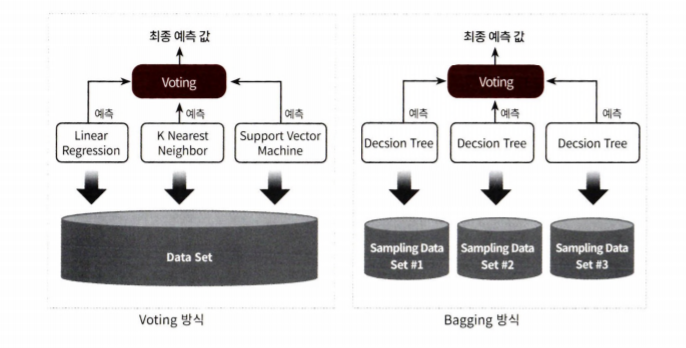
왼쪽 그림은 보팅 분류기를 도식화한 것. 선형 회귀, K 최근접 이웃, 서포트 벡터 머신이라는 3
개의 ML 알고리즘이 같은 데이터 세트에 대해 학습하고 예측한 결과를 가지고 보팅을 통해 최종 예측
결과를 선정하는 방식<br>
오른쪽 그림은 배깅 분류기를 도식화한 것. 단일 ML 알고리즘(결정 트리)으로 여러 분류기가 학습으로 개별 예측을 하는데, 학습하는 데이터 세트가 보팅 방식과는 다름. 개별 분류기에 할당된
학습 데이터는 원본 학습 데이터를 샘플링해 추출하는데, 이렇게 개별 Classifier에게 데이터를 샘플링
해서 추출하는 방식을 부트스트래핑(Bootstrapping) 분할 방식이라 부름.<br>
 개별 분류기가 부트
스트래핑 방식으로 샘플링된 데이터 세트에 대해서 학습을 통해 개별적인 예측을 수행한 결과를 보팅을 통해서 최종 예측 결과를 선정하는 방식이 바로 배깅 앙상블 방식. 교차 검증이 데이터 세트간에 중첩을 허용하지 않는 것과 다르게 배깅 방식은 중첩을 허용

부스팅은 여러 개의 분류기가 순차적으로 학습을 수행하되, 앞에서 학습한 분류기가 예측이 틀린 데이터에 대해서는 올바르게 예측할 수 있도록 다음 분류기에게는 가중치(weight)를 부여하면서 학습과 예측을 진행하는 것이다. 계속해서 분류기에게 가중치를 부스팅하면서 학습을 진행하기에 부스팅 방식으로 불린다. 예측 성능이 뛰어나 앙상블 학습을 주도하고 있으며 대표적인 부스팅 모듈로 그래디언트 부스트, XGBoost(eXtra Gradient Boost), LightGBM(Light Gradient Boost)이 있다.

스태킹은 여러 가지 다른 모델의 예측 결괏값을 다시 학습 데이터로 만들어서 다른 모델(메타 모델)로
재학습시켜 결과를 예측하는 방법


***보팅 유형 - 하드 보팅(Hard Voting)과 소프트 보팅(Soft Voting)***

* 하드 보팅을 이용한 분류(Classification)는 다수결 원칙과 비슷하다. 예측한 결괏값들중 다수의 분류기가 결정한 예측값을최종 보팅 결괏값으로 선정하는 것
* 소프트 보팅은 분류기들의 레이블 값 결정 확률을 모두 더하고 이를 평균해서 이들 중 확률이 가장 높은 레이블 값을 최종 보팅 결괏값으로 선정-->일반적인 보팅방법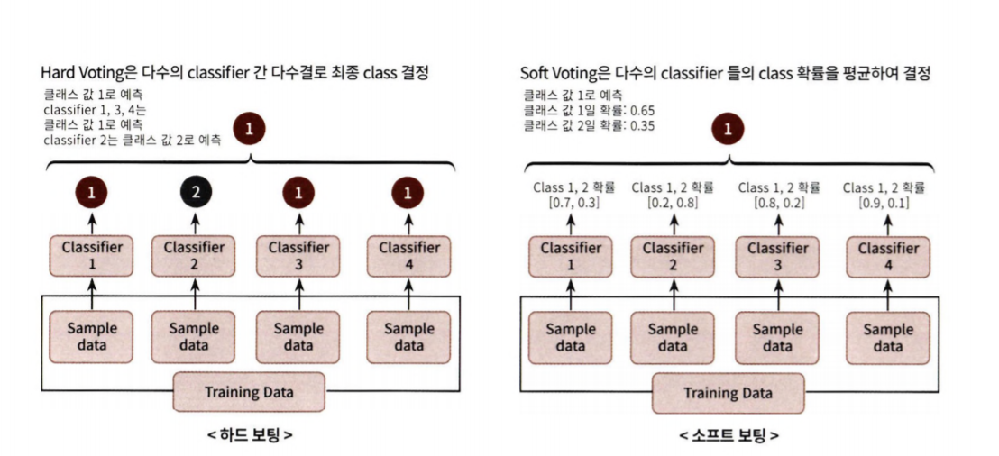
일반적으로 하드 보팅보다는 소프트 보팅이 예측 성능이 좋아서 더 많이 사용


***보팅 분류기(Voting Classifier)***

사이킷런은 보팅 방식의 앙상블을 구현한 VotingClassifier 클래스를 제공

In [12]:
import pandas as pd

from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

cancer = load_breast_cancer()

data_df = pd.DataFrame(cancer.data, columns=cancer.feature_names)
data_df.head(3)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.0,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


In [13]:

# 개별 모델은 로지스틱 회귀와 KNN 임. 
lr_clf = LogisticRegression()
knn_clf = KNeighborsClassifier(n_neighbors=8)

# 개별 모델을 소프트 보팅 기반의 앙상블 모델로 구현한 분류기 
vo_clf = VotingClassifier( estimators=[('LR',lr_clf),('KNN',knn_clf)] , voting='soft' )
# voting은 'hard'시 하드 보팅, soft 시 소프트 보팅 방식을 적용하라는 의미(기본은‘hard)

X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target, 
                                                    test_size=0.2 , random_state= 156)

# VotingClassifier 학습/예측/평가. 
vo_clf.fit(X_train , y_train)
pred = vo_clf.predict(X_test)
print('Voting 분류기 정확도: {0:.4f}'.format(accuracy_score(y_test , pred)))

# 개별 모델의 학습/예측/평가.
classifiers = [lr_clf, knn_clf]
for classifier in classifiers:
    classifier.fit(X_train , y_train)
    pred = classifier.predict(X_test)
    class_name= classifier.__class__.__name__
    print('{0} 정확도: {1:.4f}'.format(class_name, accuracy_score(y_test , pred)))

Voting 분류기 정확도: 0.9561
LogisticRegression 정확도: 0.9474
KNeighborsClassifier 정확도: 0.9386


=> 보팅 분류기가 정확도가 조금 높게 나타났는데, 보팅으로 여러 개의 기반 분류기를 결합한다고 해서 무조건 기반 분류기보다 예측 성능이 향상되지는 않다. 데이터의 특성과 분포 등 다양한 요건에 따라
오히려 기반 분류기 중 가장 좋은 분류기의 성능이 보팅했을 때보다 나을 수도 있다.

그럼에도 불구하고 지금 소개하는 보팅을 포함해 배깅과 부스팅 등의 앙상블 방법은 전반적으로 다른
단일 ML 알고리즘보다 뛰어난 예측 성능을 가지는 경우가 많다. 고정된 데이터 세트에서 단일 ML
알고리즘이 뛰어난 성능을 발휘하더라도 현실 세계는 다양한 변수와 예측이 어려운 규칙으로 구성돼있다. 다양한 관점을 가진 알고리즘이 서로 결합해 더 나은 성능을 실제 환경에서 끌어낼 수 있다. 

ML 모델의 성능은 이렇게 다양한 테스트 데이터에 의해 검증되므로 어떻게 높은 유연성을 가지고 현실에 대처할 수 있는가가 중요한 ML 모델의 평가요소가 된다. 이런 관점에서 편향-분산 트레이드오프는 ML 모델이 극복해야 할 중요 과제. 보팅과 스태킹 등은 서로 다른 알고리즘을 기반으로 하고 있지만, 배깅과 부스팅은 대부분 결정 트리 알고리즘을 기반으로 한다. 
* 결정 트리 알고리즘은 쉽고 직관적인 분류 기준을 가지고 있지만 정확한 예측을 위해 학습 데이터의 예외 상황에 집착한 나머지오히려 과적합이 발생해 실제 테스트 데이터에서 예측 성능이 떨어지는 현상이 발생하기 쉽다.
* 하지만 앙상블 학습에서는 이 같은 결정 트리 알고리즘의 단점을 수십〜수천 개의 매우 많은 분류기를 결합해 다양한 상황을 학습하게 함으로써 극복하고 있다. 
결정 트리 알고리즘의
장점은 그대로 취하고 단점은 보완하면서 편향-분산 트레이드오프의 효과를 극대화할 수 있다는 것

### 04. 랜덤 포레스트

***랜덤 포레스트의 개요 및 실습***<br>
배깅(bagging)은 앞에서 소개한 보팅과는 다르게, 같은 알고리즘으로 여러 개의 분류기를 만들어서보팅으로 최종 결정하는 알고리즘. 랜덤 포레스트가 대표적인 알고리즘!

앙상블 알고리즘 중 비교적 빠른 수행 속도를 가지고 있으며,
다양한 영역에서 높은 예측 성능을 보이고 있다. 랜덤 포레스트의 기반 알고리즘은 결정 트리로서,
결정 트리의 쉽고 직관적인 장점을 그대로 가지고 있다(랜덤 포레스트뿐만 아니라 부스팅 기반의
다양한 앙상블 알고리즘 역시 대부분 결정 트리 알고리즘을 기반 알고리즘으로 채택하고 있다).
랜덤 포레스트는 여러 개의 결정 트리 분류기가 전체 데이터에서 배깅 방식으로 각자의 데이터를 샘플링해 개별적으로 학습을 수행한 뒤 최종적으로 모든 분류기가 보팅을 통해 예측 결정을 하게 된다.
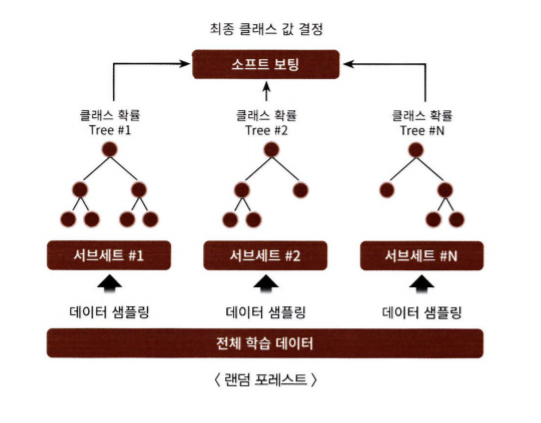
랜덤 포레스트는 개별적인 분류기의 기반 알고리즘은 결정 트리이지만 개별 트리가 학습하는 데이터
세트는 전체 데이터에서 일부가 중첩되게 샘플링된 데이터 세트.

이렇게 여러 개의 데이터 세트를 중첩되게 분리하는 것을 부트스트래핑(bootstrapping) 분할 방식. 랜덤 포레스트의 서브세트(Subset) 데이터는 이러한 부트스트래핑으로 데이터가 임의로 만들어짐. 서브세트의 데이터 건수는 전체 데이터 건수와 동일하지만. 개별 데이터가 중첩되어 만들어진다. 원본 데이터의 건수가 10개인 학습 데이터 세트에 랜덤 포레스트를 3개의 결정 트리 기반으로 학습하려고 n_estimators= 3으로 하이퍼 파라미터를 부여하면 다음과 같이 데이터 서브세트가 만들어 짐.
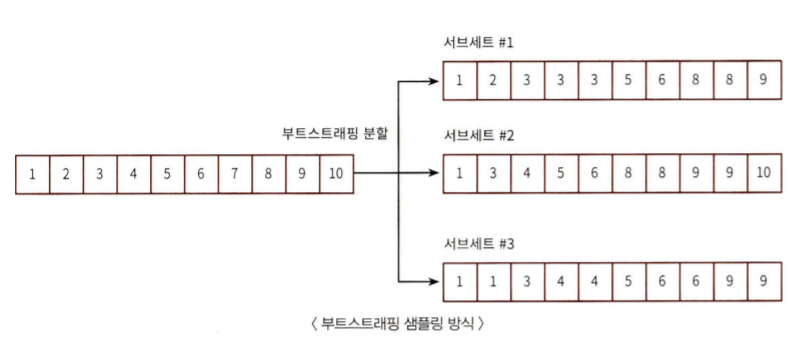
이렇게 데이터가 중첩된 개별 데이터 세트에 결정 트리 분류기를 각각 적용하는 것이 랜덤 포레스트. 사이킷런은 RandomForestCkissifier 클래스를 통해 랜덤 포레스트 기반의 분류를 지원

In [15]:
import pandas as pd

def get_human_dataset( ):
    
    # 각 데이터 파일들은 공백으로 분리되어 있으므로 read_csv에서 공백 문자를 sep으로 할당.
    feature_name_df = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\features.txt',sep='\s+',
                        header=None,names=['column_index','column_name'])
    # DataFrame에 피처명을 컬럼으로 부여하기 위해 리스트 객체로 다시 변환
    feature_name = feature_name_df.iloc[:, 1].values.tolist()
    
    # 학습 피처 데이터 셋과 테스트 피처 데이터을 DataFrame으로 로딩. 컬럼명은 feature_name 적용
    X_train = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\train\\X_train.txt',sep='\s+', names=feature_name )
    X_test = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\test\\X_test.txt',sep='\s+', names=feature_name)
    
        # 학습 레이블과 테스트 레이블 데이터을 DataFrame으로 로딩하고 컬럼명은 action으로 부여
    y_train = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\train\\y_train.txt',sep='\s+',header=None,names=['action'])
    y_test = pd.read_csv('C:\\Users\\Administrator\\Downloads\\human_activity\\test\\y_test.txt',sep='\s+',header=None,names=['action'])
    
    # 로드된 학습/테스트용 DataFrame을 모두 반환 
    return X_train, X_test, y_train, y_test


X_train, X_test, y_train, y_test = get_human_dataset()

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# 결정 트리에서 사용한 get_human_dataset( )을 이용해 학습/테스트용 DataFrame 반환
X_train, X_test, y_train, y_test = get_human_dataset()

# 랜덤 포레스트 학습 및 별도의 테스트 셋으로 예측 성능 평가
rf_clf = RandomForestClassifier(random_state=0)
rf_clf.fit(X_train , y_train)
pred = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test , pred)
print('랜덤 포레스트 정확도: {0:.4f}'.format(accuracy))

랜덤 포레스트 정확도: 0.9108


=> 랜덤 포레스트는 사용자 행동 인식 데이터 세트에 대해 약 91.08%의 정확도를 보여줌

***랜덤 포레스트 하이퍼 파라미터 및 튜닝***

트리 기반의 앙상블 알고리즘의 단점을 굳이 뽑자면 하이퍼 파라미터가 너무 많고, 그로 인해서 튜닝을
위한 시간이 많이 소모된다는 것. 더구나 많은 시간을 소모했음에도 튜닝 후 예측 성능이 크게
향상되는 경우가 많지 않아서 더욱 아쉬움. 트리 기반 자체의 하이퍼 파라미터가 원래 많은 데다
배깅, 부스팅. 학습, 정규화 등을 위한 하이퍼 파라미터까지 추가되므로 일반적으로 다른 ML 알고리즘
에 비해 많을 수밖에 없다. 그나마 랜덤 포레스트가 적은 편에 속하는데. 결정 트리에서 사용되는
하이퍼 파라미터와 같은 파라미터가 대부분이기 때문

In [18]:
from sklearn.model_selection import GridSearchCV

params = {
    'n_estimators':[100], #랜덤 포레스트에서 결정 트리의 개수를 지정(디폴트10)
    # max_features: 결정 트리에 사용된 maxjeatures 파라미터와 같습니다. 하지만 RandomForestClassifier의 기본
    #max_features는 ‘None’이 아니라 ‘auto’, 즉 ‘sqrt와 같습니다(전체 피처가 16개라면 분할을 위해 4개 참조)
    'max_depth' : [6, 8, 10, 12], 
    'min_samples_leaf' : [8, 12, 18 ],
    'min_samples_split' : [8, 16, 20] # 3개는 결정 트리에서 과적합을 개선하기 위해 사용되는 파라미터
}
# RandomForestClassifier 객체 생성 후 GridSearchCV 수행
rf_clf = RandomForestClassifier(random_state=0, n_jobs=-1)
grid_cv = GridSearchCV(rf_clf , param_grid=params , cv=2, n_jobs=-1 )
grid_cv.fit(X_train , y_train)

print('최적 하이퍼 파라미터:\n', grid_cv.best_params_)
print('최고 예측 정확도: {0:.4f}'.format(grid_cv.best_score_))

최적 하이퍼 파라미터:
 {'max_depth': 10, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 100}
최고 예측 정확도: 0.9166


In [19]:
# n_estimators를 300으로 증가시키고, 최적화 하이퍼 파라미터로 다시 RandomForestClassifier를 학습시킨 뒤에 
# 이번에는 별도의 테스트 데이터 세트에서 예측 성능을 측정
rf_clf1 = RandomForestClassifier(n_estimators=300, max_depth=10, min_samples_leaf=8, \
                                 min_samples_split=8, random_state=0)
rf_clf1.fit(X_train , y_train)
pred = rf_clf1.predict(X_test)
print('예측 정확도: {0:.4f}'.format(accuracy_score(y_test , pred)))

예측 정확도: 0.9165


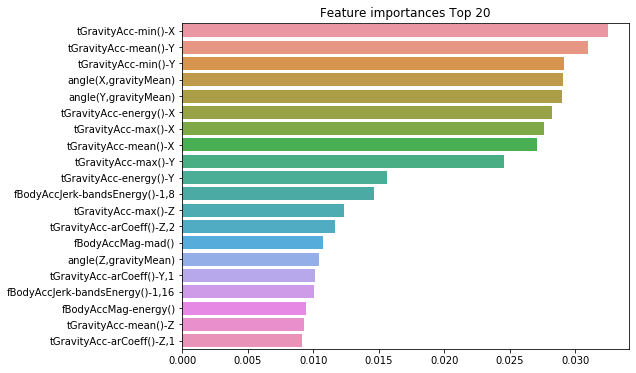

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# 피처 중요도 시각화
ftr_importances_values = rf_clf1.feature_importances_
ftr_importances = pd.Series(ftr_importances_values,index=X_train.columns  )
ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]

plt.figure(figsize=(8,6))
plt.title('Feature importances Top 20')
sns.barplot(x=ftr_top20 , y = ftr_top20.index)
plt.show()

***

### 05. GBM(Gradient Boosting Machine)

***GBM의 개요 및 실습***

부스팅 알고리즘은 여러 개의 약한 학습기(weak learner)를 순차적으로 학습-예측하면서 잘못 예측한 데이터에 가중치 부여를 통해 오류를 개선해 나가면서 학습하는 방식. 부스팅의 대표적인 구현은 AdaBoost(Adaptive boosting)와 그래디 언트 부스트가 있다. 에이다 부스트(AdaBoost)는
오류 데이터에 가중치를 부여하면서 부스팅을 수행하는 대표적인 알고리즘
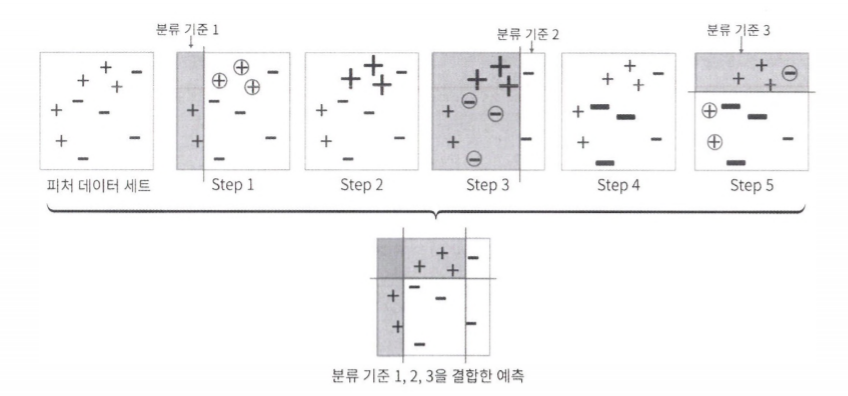
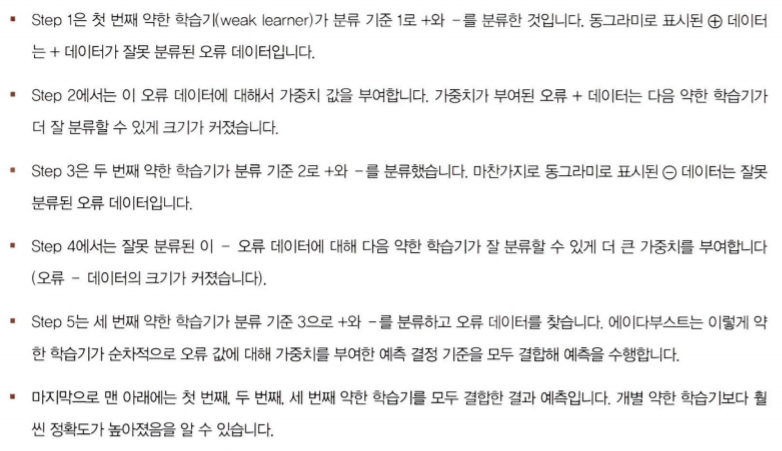

개별 약한 학습기는 다음 그림과 같이 각각 가중치를 부여해 결합. 예를 들어 첫 번째 학습기에
가중치 0.3, 두 번째 학습기에 가중치 0.5, 세 번째 학습기에 중가중치 0.8을 부여한 후 모두 결합해 예측을 수행
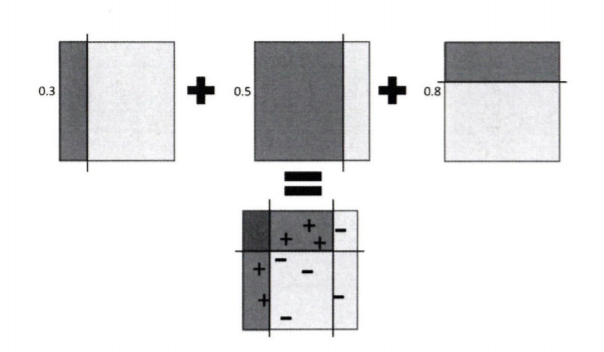.

GBM(Gradient Boost Machine)도 에이다부스트와 유사하나, 가중치 업데이트를 경사 하강법
(Gradient Descent)을 이용하는 것이 큰 차이. 
> * 오류 값은 실제 값 - 예측값
> * 분류의 실제 결괏값을 y, 피처를,$x{1},x{2},...,x{n}$ 그리고 이 피처에 기반한 예측 함수를 $F(x)$ 함수라고 하면 오류식은 $h(x) = y - F(x)$이 된다. 이 오류식을 최소화하는 방향성을 가지고 반복적으로 가중치 값을 업데이트하는 것이 경사 하강법(Gradient Descent) 

In [21]:
from sklearn.ensemble import GradientBoostingClassifier
import time
import warnings
warnings.filterwarnings('ignore')

X_train, X_test, y_train, y_test = get_human_dataset()

# GBM 수행 시간 측정을 위함. 시작 시간 설정.
start_time = time.time()

gb_clf = GradientBoostingClassifier(random_state=0)
gb_clf.fit(X_train , y_train)
gb_pred = gb_clf.predict(X_test)
gb_accuracy = accuracy_score(y_test, gb_pred)

print('GBM 정확도: {0:.4f}'.format(gb_accuracy))
print("GBM 수행 시간: {0:.1f} 초 ".format(time.time() - start_time))

GBM 정확도: 0.9376
GBM 수행 시간: 361.2 초 


=> 기본 하이퍼 파라미터만으로 93.76%의 예측 정확도로 앞의 랜덤 포레스트보다 나은 예측 성능을 나타냄. 그렇지 않은 경우도 있겠지만. 일반적으로 GBM이 랜덤 포레스트보다는 예측 성능이 조금
뛰어난 경우가 많다. 그러나 수행 시간이 오래 걸리고, 하이퍼 파라미터 튜닝 노력도 더 필요. 특히 수행 시간 문제는 GBM이 극복해야 할 중요한 과제.

***GBM 하이퍼 파라미터 및 튜닝***

In [22]:
from sklearn.model_selection import GridSearchCV

params = {
    # loss： 경사 하강법에서 사용할 비용 함수를 지정. 특별한 이유가 없으면 기본값인 ‘deviance'를 그대로 적용
    'n_estimators':[100, 500],# weak learner의 개수, 기본값은 100
    'learning_rate' : [ 0.05, 0.1] # GBM이 학습을 진행할 때마다 적용하는 학습률; Weak learner가 순차적으로 오류 값을 보정해 나가는 데
                                    #적용하는 계수. 0〜1 사이의 값을 지정할 수 있으며 기본값은 0.1
                                    #너무 작은 값을 적용하면 업데이트되는 값이 작아져서 최소 오류 값을 찾아 예측 성능이 높아질 
                                    #가능성이 높다. 하지만 많은 weak learner는 순차적인 반복이 필요해서 수행 시간이 오래 걸리고、
                                    #또 너무 작게 설정하면 모든 weak learner의 반복이 완료돼도 최소 오류 값을 찾지 못할 수 있다. 
                                    #반대로 큰 값을 적용하면 최소 오류 값을 찾지 못하고 그냥 지나쳐 버려 예측 성능이 떨어질 가능성이 
                                    #높아지지만, 빠른 수행이 가능
                                    #=>>이러한 특성 때문에 leaming_rate는 n_estimators와 상호 보완적으로 조합해 사용합. 
                                        #learning_rate를 작게 하고 n_estimators를 크게 하면 더 이상 성능이 좋아지지 않는 한계점까지는
                                        #예측 성능이 조금씩 좋아질 수 있지만수행 시간이 너무 오래 걸리며, 
                                        #예측 성능 역시 현저히 좋아지지는 않는다
    
    
    # subsample： weak learner가 학습에 사용하는 데이터의 샘플링 비율입니다. 기본값은 1이며, 이는 전체 학습 데이터를
    #기반으로 학습한다는 의미입니다(0.5이면 학습 데이터의 50%).
}
grid_cv = GridSearchCV(gb_clf , param_grid=params , cv=2 ,verbose=1)
grid_cv.fit(X_train , y_train)
print('최적 하이퍼 파라미터:\n', grid_cv.best_params_)
print('최고 예측 정확도: {0:.4f}'.format(grid_cv.best_score_))

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed: 20.9min finished


최적 하이퍼 파라미터:
 {'learning_rate': 0.05, 'n_estimators': 500}
최고 예측 정확도: 0.9010


In [23]:
# GridSearchCV를 이용하여 최적으로 학습된 estimator로 predict 수행. 
gb_pred = grid_cv.best_estimator_.predict(X_test)
gb_accuracy = accuracy_score(y_test, gb_pred)
print('GBM 정확도: {0:.4f}'.format(gb_accuracy))

GBM 정확도: 0.9410


=> GBM은 과적합에도 강한 뛰어난 예측 성능을 가진 알고리즘. 하지만 수행 시간이 오래 걸린다는 단점 있다.

---

### 06. XGBoost(eXtra Gradient Boost)

***XGBoost 개요***<br>
XGBoost는 트리 기반의 앙상블 학습에서 가장 각광받고 있는 알고리즘 중 하나. 분류에 있어서 일반적으로 다른 머신러닝보다 뛰어
난 예측 성능을 나타냄.*XGBoost는 GBM에 기반하고 있지만, GBM의 단점인 느린 수행 시간 및
과적합 규제(Regularization) 부재 등의 문제를 해결해서 매우 각광을 받고 있다.* 특히 XGBoost는 병렬 CPU 환경에서 병렬 학습이 가능해 기존 GBM보다 빠르게 학습을 완료할 수 있다.
> * XGBoost의 주요 장점
>> * 뛰어난 예측 성능 : 일반적으로 분류와 회귀 영역에서 뛰어난 예측 성능을 발휘
>> * GBM 대비 빠른 수행 시간 : 일반적인 GBM은 순차적으로 Weak learner가 가중치를 증감하는 방법으로 학습하기 때문에 전반적으로 속도가 느립니다. 하지만 XGBoost는 병렬 수행 및 다양한 기능으로 빠른 수행 시간 성능을 보장합니다. 아쉽게도 XGBoost가 일반적인 GBM에 비해 수행 시간이 빠르다는 것이지, 다른 머신러닝 알고리즘(예를 들어 랜덤 포레스트)에 비해서 빠르다는 의미는 아닙니다
>> * 과적합 규제((Regularization) : 표준 GBM의 경우 과적합 규제 기능이 없으나 XGBoost는 자체에 과적합 규제 기능으로 과적합에 좀 더 강한 내구성을 가질 수 있음
>> * Tree Pruning(나무가지치기) : 다른 GBM과 마찬가지로 XGBoost도 max_depth 파라미터로 분할 깊이를 조정하기도 하지만, tree pruning으로 더 이상 긍정 이득이 없는 분할을 가지치기 해서 분할 수를 더 줄이는 추가적인 장점을 가지고 있다.
>> * 자체 내장된 교차검증 : XGBoost는 반복 수행 시마다 내부적으로 학습 데이터 세트와 평가 데이터 세트에 대한 교차 검증을 수행해 최적화된 반복 수행 횟수를 가질 수 있다. 지정된 반복 횟수가 아니라 교차 검증을 통해 평가 데이터 세트의 평가 값이 최적화 되면 반복을 중간에 멈출 수 있는 조기 중단 기능이 있다.
>> * 결손값 자체 처리 : XGBoost는 결손값을 자체 처리할 수 있는 기능 있음


 XGBoost 개발 그룹은 파이썬에서도
XGBoost를 구동할 수 있도록 파이썬 패키지를 제공 -> XGBoost 고유의 프레임워크를 파이썬 언어 기반에서 구현한 것으로 별도의 API 기반이었다. 사이킷런 프레임워크를 기반으로 한 것이 아니기에 사이킷런의 fit( ), predict( ) 메서드와 같은 사이킷런 고유의 아키텍처가 적용될 수 없으며, 다양한 유틸리티
(cross_val_score, GridSearchCV, Pipeline 등)와 함께 사용될 수 없었다.<br>
 XGBoost 패키지의 사이킷런 래퍼 클래스는 XGBClassifier와 XGBRegressor. 이를 이용하면 사이킷런
estimator가 학습을 위해 사용하는 fit()과 predict()와 같은 표준 사이킷런 개발 프로세스 및 다양한
유틸리티를 활용할 수 있다.


***파이썬 래퍼 XGBoost 하이퍼 파라미터***

XGBoost는 GBM과 유사한 하이퍼 파라미터를
동일하게 가지고 있으며. 여기에 조기 중단(early stopping), 과적합을 규제하기 위한 하이퍼 파라미터 등이 추가됐다.
파이썬 래퍼 XGBoost 모듈과 사이킷런 래퍼 XGBoost 모듈의 일부 하이퍼 파라미터는 약간 다르므로 이에 대한 주의가 필요합니다. 정확히 표현하자면 동일한 기능을 의미하는 하이퍼 파라미터이지만,
사이킷런 파라미터의 범용화된 이름 규칙 (Naming Rule) 에 따라 파라미터 명이 달라진다.
* 파이썬 래퍼 XGBoost 하이퍼 파라미터 유형별
> * 일반 파라미터: 일반적으로 실행 시 스레드의 개수나 silent 모드 등의 선택을 위한 파라미터로서 디폴트 파라미터 값을 바꾸는 경우는 거의 없습니다
> * 부스터 파라미터: 트리 최적화, 부스팅. regularization 등과 관련 파라미터 등을 지칭합니다.
> * 학습 태스크 파라미터: 학습 수행 시의 객체 함수, 평가를 위한 지표 등을 설정하는 파라미터입니다.
>> * 주요 일반 파라미터
>>> * booster： gbtree(tree based model) 또는 gblinear( linear model) 선택. 디폴트는 gbtree입니다
>>> * silent： 디폴트는 0이며, 출력 메시지를 나타내고 싶지 않을 경우 로 설정합니다.
>>> *  nthread： CPU의 실행 스레드 개수를 조정하며, 디폴트는 CPU의 전체 스레드를 다 사용하는 것입니다. 멀티 코어/스레드
CPU 시스템에서 전체 CPU를 사용하지 않고 일부 CPU만 사용해 ML 애플리케이션을 구동하는 경우에 변경합니다.
>> * 주요 부스터 파라미터
>>> * eta [defa나t=0.3, alias： learning_rate]： GBM의 학습률(learning rate)과 같은 파라미터입니다. 0에서 1 사이의 값을
지정하며 부스팅 스텝을 반복적으로 수행할 때 업데이트되는 학습률 값 파이썬 래퍼 기반의 xgboost를 이용할 경우 디
폴트는 0.3. 사이킷런 래퍼 클래스를 이용할 경우 eta는 learning_rate 파라미터로 대체되며. 디폴트는 0.1 입니다. 보통은
0.01 〜 0.2 사이의 값을 선호합니다.
>>> * num_boost_rounds： GBM의 n_estimators와 같은 파라미터입니다.
>>> * min_child_weight[defa나t=l]： 트리에서 추가적으로 가지를 나눌지를 결정하기 위해 필요한 데이터들의 weight 총합.
min_child_weight이 클수록 분할을 자제합니다. 과적합을 조절하기 위해 사용됩니다.
>>> * gamma [default=0, alias： min_split_loss]： 트리의 리프 누드를 추가적으로 나눌지를 결정할 최소 손실 감소 값입니
다. 해당 값보다 큰 손실(loss)이 감소된 경우에 리프 노드를 분리합니다. 값이 클수록 과적합 감소 효과가 있습니다.
>>> * max_depth[default=6]： 트리 기반 알고리즘의 max_depth와 같습니다. 0을 지정하면 깊이에 제한이 없습니다. Max_
depth가 높으면 특정 피처 조건에 특화되어 룰 조건이 만들어지므로 과적합 가능성이 높아지며 보통은 3〜10 사이의 값
을 적용합니다.
>>> * sub_sample[default=1]： GBM의 subsample과 동일합니다. 트리가 커져서 과적합되는 것을 제어하기 위해 데이터를
샘플링하는 비율을 지정합니다. sub_sample그).5로 지정하면 전체 데이터의 절반을 트리를 생성하는 데 사용합니다. 0에
서 1사이의 값이 가능하나 일반적으로 0.5 〜 1 사이의 값을 사용합니다.
>>> * colsample_bytree[default=1 ]： GBM의 max_features와 유사합니다. 트리 생성에 필요한 피처(칼럼)를 임의로 샘플링
하는 데 사용됩니다. 매우 많은 피처가 있는 경우 과적합을 조정하는 데 적용합니다.
>>> * lambda [defaults, alias： reg_lambda]： L2 Regularization 적용 값입니다. 피처 개수가 많을 경우 적용을 검토하며
값이 클수록 과적합 감소 효과가 있습니다.
>>> * alpha [default=O, alias： reg_alpha]： L1 Regularization 적용 값입니다. 피처 개수가 많을 경우 적용을 검토하며 값이
클수록 과적합 감소 효과가 있습니다.
>>> * scale_pos_weight [defaults]： 특정 값으로 치우친 비대칭한 클래스로 구성된 데이터 세트의 균형을 유지하기 위한 파
라미터입니다
>> * 학습 태스크 파라미터
>>> * objective： 최솟값을 가져야할 손실 함수를 정의합니다. XGBoost는 많은 유형의 손실함수를 사용할 수 있습니다. 주로 사
용되는 손실함수는 이진 분류인지 다중 분류인지에 따라 달라집니다.
>>> * binary：logistic： 이진 분류일 때 적용합니다.
>>> * multi：softmax： 다중 분류일 때 적용합니다. 손실함수가 multKsottmax일 경우에는 레이블 클래스의 개수인 num_class
파라미 터를 지정해야 합니 다.
>>> * multi：softprob： multi：softmax와 유사하나 개별 레이블 클래스의 해당되는 예측 확률을 반환합니다.
>>> * eval_metric： 검증에 사용되는 함수를 정의합니다. 기본값은 회귀인 경우는 rmse, 분류일 경우에는 error입니다. 다음은
evaljnetric의 값 유형입니다
>>>> * rmse： Root Mean Square Error
>>>> * mae： Mean Absolute Error
>>>> * logloss： Negative log—likelihood
>>>> * error： Binary classification error rate (0.5 threshold)
>>>> * merror： Multiclass classification error rate
>>>> * mlogloss： Multiclass logloss
>>>> * auc： Area under the curve
 
 
* 과적합 문제가 심각하다면 다음과 같이 적용할 것을 고려
> * eta 값을 낮춥니다(0.01 〜 0.1). eta 값을 낮출 경우 num_round(또는 n_estimators)는 반대로 높여줘야 합니다.
> * max_depth 값을 낮춥니다..
> * min_child_weight 값을 높입니다.
> * gamma 값을 높입니다.
> * 또한 subsample과 colsample_bytree를 조정하는 것도 트리가 너무 복잡하게 생성되는 것을 막아 과적합 문제에 도움이 될 수 있습니다.


XGBoost 자체적으로 교차 검증, 성능 평가. 피처 중요도 등의 시각화 기능을 가지고 있다. 또한
XGBoost는 기본 GBM에서 부족한 다른 여러 가지 성능 향상 기능이 있습니다. 그중에 수행 속도를
향상시키기 위한 대표적인 기능으로 조기 중단(Early Stopping) 기능이 있다. 기본 GBM의 경우 n_estimat()rs(또는 num_boost_rounds)에 지정된 횟수만큼 반복적으로 학습 오류를 감소시키며
학습을 진행하면서 중간에 반복을 멈출 수 없고 n_estimators에 지정된 횟수를 다 완료해야 한다.
XGBoost, 그리고 뒤에서 소개할 LightGBM은 모두 조기 중단 기능이 있어서 n_estimators에 지정한
부스팅 반복 횟수에 도달하지 않더라도 예측 오류가 더 이상 개선되지 않으면 반복을 끝까지 수행하지
않고 중지해 수행 시간을 개선할 수 있습니다.
예를 들어 n_estimators를 200으로 설정하고 조기 중단 파라미터 값을 50으로 설정하면, 1부터 200회까지 부스팅을 반복하다가 50회를 반복하는 동안 학습 오류가 감소하지 않으면 더 이상 부스팅을 진행하지 않고 종료합니다(가령 100회에서 학습 오류 값이 0.8인데, 101 〜 150회 반복하는 동안 예측 오류가 0.8보다 작은 값이 하나도 없으면 부스팅을 종료합니다).

*파이썬 래퍼 XGBoost 적용 - 위스콘신 유방암 예측*

In [2]:
import xgboost as xgb
from xgboost import XGBClassifier

In [3]:
import xgboost as xgb
from xgboost import plot_importance
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

dataset = load_breast_cancer()
X_features= dataset.data
y_label = dataset.target

cancer_df = pd.DataFrame(data=X_features, columns=dataset.feature_names)
cancer_df['target']= y_label
cancer_df.head(3)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.0,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0


In [4]:
print(dataset.target_names)
print(cancer_df['target'].value_counts())

['malignant' 'benign']
1    357
0    212
Name: target, dtype: int64


In [5]:

# 전체 데이터 중 80%는 학습용 데이터, 20%는 테스트용 데이터 추출
X_train, X_test, y_train, y_test=train_test_split(X_features, y_label,
                                         test_size=0.2, random_state=156 )
print(X_train.shape , X_test.shape)

(455, 30) (114, 30)


In [6]:
dtrain = xgb.DMatrix(data=X_train , label=y_train)
dtest = xgb.DMatrix(data=X_test , label=y_test)

In [7]:
params = { 'max_depth':3,
           'eta': 0.1,
           'objective':'binary:logistic',
           'eval_metric':'logloss' # 평가 세트에 적용할 성능 평가 방법. 분류일 경우 주로 ‘error’(분류 오류), logloss’를 적용.
          #,'early_stoppings' : 100 조기 중단 할 수 있는 최소 반복 횟수를 100으로 설정
        }
num_rounds = 400

In [8]:
# train 데이터 셋은 ‘train’ , evaluation(test) 데이터 셋은 ‘eval’ 로 명기합니다. 
wlist = [(dtrain,'train'),(dtest,'eval') ]
# 하이퍼 파라미터와 early stopping 파라미터를 train( ) 함수의 파라미터로 전달
xgb_model = xgb.train(params = params , dtrain=dtrain , num_boost_round=num_rounds , 
                      early_stopping_rounds=100, evals=wlist )

[0]	train-logloss:0.609688	eval-logloss:0.61352
Multiple eval metrics have been passed: 'eval-logloss' will be used for early stopping.

Will train until eval-logloss hasn't improved in 100 rounds.
[1]	train-logloss:0.540803	eval-logloss:0.547842
[2]	train-logloss:0.483753	eval-logloss:0.494247
[3]	train-logloss:0.434457	eval-logloss:0.447986
[4]	train-logloss:0.39055	eval-logloss:0.409109
[5]	train-logloss:0.354145	eval-logloss:0.374977
[6]	train-logloss:0.321221	eval-logloss:0.345714
[7]	train-logloss:0.292592	eval-logloss:0.320529
[8]	train-logloss:0.267467	eval-logloss:0.29721
[9]	train-logloss:0.245153	eval-logloss:0.277991
[10]	train-logloss:0.225694	eval-logloss:0.260302
[11]	train-logloss:0.207937	eval-logloss:0.246037
[12]	train-logloss:0.192184	eval-logloss:0.231556
[13]	train-logloss:0.177916	eval-logloss:0.22005
[14]	train-logloss:0.165222	eval-logloss:0.208572
[15]	train-logloss:0.153622	eval-logloss:0.199993
[16]	train-logloss:0.14333	eval-logloss:0.190118
[17]	train-logl

[161]	train-logloss:0.007261	eval-logloss:0.088013
[162]	train-logloss:0.007241	eval-logloss:0.087758
[163]	train-logloss:0.007221	eval-logloss:0.087784
[164]	train-logloss:0.0072	eval-logloss:0.087777
[165]	train-logloss:0.00718	eval-logloss:0.087517
[166]	train-logloss:0.007161	eval-logloss:0.087542
[167]	train-logloss:0.007142	eval-logloss:0.087642
[168]	train-logloss:0.007122	eval-logloss:0.08739
[169]	train-logloss:0.007103	eval-logloss:0.087377
[170]	train-logloss:0.007084	eval-logloss:0.087298
[171]	train-logloss:0.007065	eval-logloss:0.087368
[172]	train-logloss:0.007047	eval-logloss:0.087395
[173]	train-logloss:0.007028	eval-logloss:0.087385
[174]	train-logloss:0.007009	eval-logloss:0.087132
[175]	train-logloss:0.006991	eval-logloss:0.087159
[176]	train-logloss:0.006973	eval-logloss:0.086955
[177]	train-logloss:0.006955	eval-logloss:0.087053
[178]	train-logloss:0.006937	eval-logloss:0.08697
[179]	train-logloss:0.00692	eval-logloss:0.086973
[180]	train-logloss:0.006901	eval-log

In [9]:
pred_probs = xgb_model.predict(dtest)
print('predict( ) 수행 결과값을 10개만 표시, 예측 확률 값으로 표시됨')
print(np.round(pred_probs[:10],3))

# 예측 확률이 0.5 보다 크면 1 , 그렇지 않으면 0 으로 예측값 결정하여 List 객체인 preds에 저장 
preds = [ 1 if x > 0.5 else 0 for x in pred_probs ]
print('예측값 10개만 표시:',preds[:10])

predict( ) 수행 결과값을 10개만 표시, 예측 확률 값으로 표시됨
[0.934 0.003 0.91  0.094 0.993 1.    1.    0.999 0.997 0.   ]
예측값 10개만 표시: [1, 0, 1, 0, 1, 1, 1, 1, 1, 0]


In [10]:

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score

def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix( y_test, pred)
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

In [11]:
get_clf_eval(y_test , preds, pred_probs)

오차 행렬
[[35  2]
 [ 1 76]]
정확도: 0.9737, 정밀도: 0.9744, 재현율: 0.9870,    F1: 0.9806, AUC:0.9951


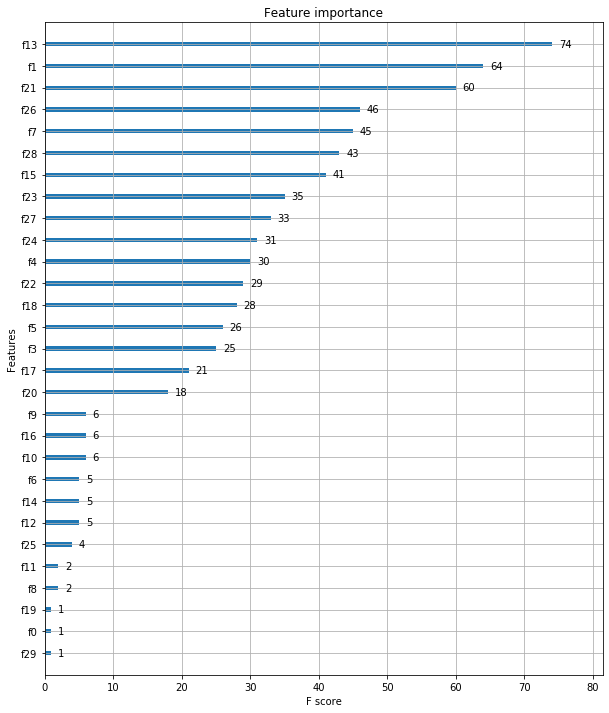

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
# xgboost 패키지에 내장된 시각화 기능을 수행
fig, ax = plt.subplots(figsize=(10, 12))
plot_importance(xgb_model, ax=ax)

=>  xgboost 넘파이 기반의 피처 데이터로 학습 시에
피처명을 제대로 알 수 가 없으므로 fo, fi와 같이 피처 순서별로 M 뒤에 순서를 붙여서 x 축에 피처
들로 나열(즉fo은 첫 번째 피처, fi는 두 번째 피처를 의미).


***사이킷런 Wrapper XGBoost 개요 및 적용***

xgboost.cv(params, dtrain, num_boost_round=10, nfold=3, stratified=Falsez folds=None, metrics=(),
obj=Wone, feval=None, maximize=False, early_stopping_rounds=None, fpreproc=None, as_pandas=True,
verbose_eval=None, show_stdv=True, seed=0z callbacks=None, shuffle=True)
* params (diet)： 부스터 파라미터
* dtrain (DMatrix)： 학습 데이터
* num_boost_round (int) ： 부스팅 반복 횟수
* nfold (int)：CV 폴드 개수.
* stratified (bool): CV 수행 시 층화 표본 추출(stratified sampling) 수행 여부
* metrics (string or list of strings)： CV 수행 시 모니터링할성능평가지표
* early_stopping_rounds (int)： 조기 중단을 활성화시킴. 반복 횟수 지정.

XGBClassifier는 기존 사이킷런에서 일반적으로 사용하는 하이퍼 파라미터와 호환성을 유지하기 위해 기존의 xgboost 모듈에서 사용하던 네이티브 하이퍼 파라미터 몇 개를 다음과
같이 변경.
* eta — learning_rate
* sub_sample — subsample
* lambda — regjambda
* alpha — reg_alpha


In [13]:
# 사이킷런 래퍼 XGBoost 클래스인 XGBClassifier 임포트
from xgboost import XGBClassifier

xgb_wrapper = XGBClassifier(n_estimators=400, learning_rate=0.1, max_depth=3)
xgb_wrapper.fit(X_train, y_train)
w_preds = xgb_wrapper.predict(X_test)
w_pred_proba = xgb_wrapper.predict_proba(X_test)[:, 1]

In [14]:
get_clf_eval(y_test , w_preds, w_pred_proba)

오차 행렬
[[35  2]
 [ 1 76]]
정확도: 0.9737, 정밀도: 0.9744, 재현율: 0.9870,    F1: 0.9806, AUC:0.9951


In [15]:
from xgboost import XGBClassifier

xgb_wrapper = XGBClassifier(n_estimators=400, learning_rate=0.1, max_depth=3)
evals = [(X_test, y_test)]
xgb_wrapper.fit(X_train, y_train, early_stopping_rounds=100, eval_metric="logloss", 
                eval_set=evals, verbose=True)

ws100_preds = xgb_wrapper.predict(X_test)
ws100_pred_proba = xgb_wrapper.predict_proba(X_test)[:, 1]

[0]	validation_0-logloss:0.61352
Will train until validation_0-logloss hasn't improved in 100 rounds.
[1]	validation_0-logloss:0.547842
[2]	validation_0-logloss:0.494247
[3]	validation_0-logloss:0.447986
[4]	validation_0-logloss:0.409109
[5]	validation_0-logloss:0.374977
[6]	validation_0-logloss:0.345714
[7]	validation_0-logloss:0.320529
[8]	validation_0-logloss:0.29721
[9]	validation_0-logloss:0.277991
[10]	validation_0-logloss:0.260302
[11]	validation_0-logloss:0.246037
[12]	validation_0-logloss:0.231556
[13]	validation_0-logloss:0.22005
[14]	validation_0-logloss:0.208572
[15]	validation_0-logloss:0.199993
[16]	validation_0-logloss:0.190118
[17]	validation_0-logloss:0.181818
[18]	validation_0-logloss:0.174729
[19]	validation_0-logloss:0.167657
[20]	validation_0-logloss:0.158202
[21]	validation_0-logloss:0.154725
[22]	validation_0-logloss:0.148947
[23]	validation_0-logloss:0.143308
[24]	validation_0-logloss:0.136344
[25]	validation_0-logloss:0.132778
[26]	validation_0-logloss:0.127912

[230]	validation_0-logloss:0.086002
[231]	validation_0-logloss:0.085922
[232]	validation_0-logloss:0.086102
[233]	validation_0-logloss:0.086115
[234]	validation_0-logloss:0.086169
[235]	validation_0-logloss:0.086263
[236]	validation_0-logloss:0.086292
[237]	validation_0-logloss:0.086217
[238]	validation_0-logloss:0.086395
[239]	validation_0-logloss:0.086342
[240]	validation_0-logloss:0.08618
[241]	validation_0-logloss:0.086195
[242]	validation_0-logloss:0.086248
[243]	validation_0-logloss:0.086263
[244]	validation_0-logloss:0.086293
[245]	validation_0-logloss:0.086222
[246]	validation_0-logloss:0.086398
[247]	validation_0-logloss:0.086347
[248]	validation_0-logloss:0.086276
[249]	validation_0-logloss:0.086448
[250]	validation_0-logloss:0.086294
[251]	validation_0-logloss:0.086312
[252]	validation_0-logloss:0.086364
[253]	validation_0-logloss:0.086394
[254]	validation_0-logloss:0.08649
[255]	validation_0-logloss:0.086441
[256]	validation_0-logloss:0.08629
[257]	validation_0-logloss:0.08

In [16]:
get_clf_eval(y_test , ws100_preds, ws100_pred_proba)

오차 행렬
[[34  3]
 [ 1 76]]
정확도: 0.9649, 정밀도: 0.9620, 재현율: 0.9870,    F1: 0.9744, AUC:0.9954


In [17]:
# early_stopping_rounds를 10으로 설정하고 재 학습. 
xgb_wrapper.fit(X_train, y_train, early_stopping_rounds=10, 
                eval_metric="logloss", eval_set=evals,verbose=True)

ws10_preds = xgb_wrapper.predict(X_test)
ws10_pred_proba = xgb_wrapper.predict_proba(X_test)[:, 1]
get_clf_eval(y_test , ws10_preds, ws10_pred_proba)

[0]	validation_0-logloss:0.61352
Will train until validation_0-logloss hasn't improved in 10 rounds.
[1]	validation_0-logloss:0.547842
[2]	validation_0-logloss:0.494247
[3]	validation_0-logloss:0.447986
[4]	validation_0-logloss:0.409109
[5]	validation_0-logloss:0.374977
[6]	validation_0-logloss:0.345714
[7]	validation_0-logloss:0.320529
[8]	validation_0-logloss:0.29721
[9]	validation_0-logloss:0.277991
[10]	validation_0-logloss:0.260302
[11]	validation_0-logloss:0.246037
[12]	validation_0-logloss:0.231556
[13]	validation_0-logloss:0.22005
[14]	validation_0-logloss:0.208572
[15]	validation_0-logloss:0.199993
[16]	validation_0-logloss:0.190118
[17]	validation_0-logloss:0.181818
[18]	validation_0-logloss:0.174729
[19]	validation_0-logloss:0.167657
[20]	validation_0-logloss:0.158202
[21]	validation_0-logloss:0.154725
[22]	validation_0-logloss:0.148947
[23]	validation_0-logloss:0.143308
[24]	validation_0-logloss:0.136344
[25]	validation_0-logloss:0.132778
[26]	validation_0-logloss:0.127912


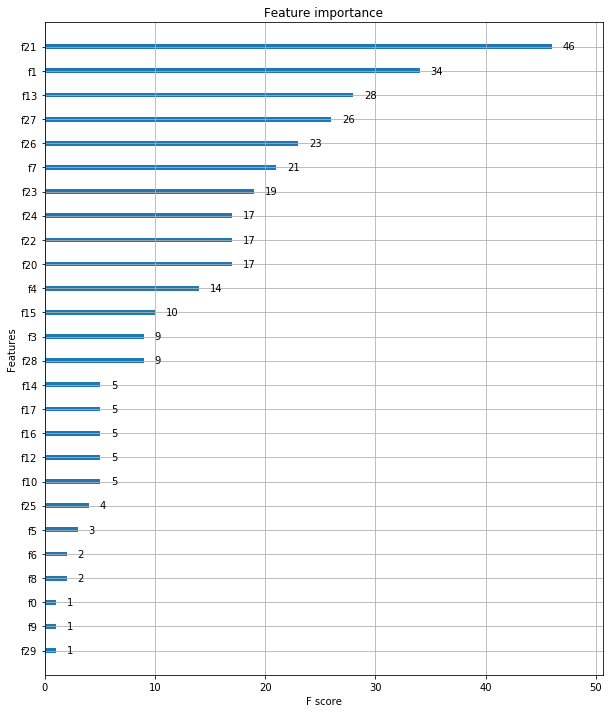

In [18]:
from xgboost import plot_importance
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(figsize=(10, 12))
# 사이킷런 래퍼 클래스를 입력해도 무방. 
plot_importance(xgb_wrapper, ax=ax)

---

### 07. LightGBM

LightGBM은 XGBoost와 함께 부스팅 계열 알고리즘에서 가장 각광을 받고 있다. LightGBM의 가장 큰 장점은 XGBoost보다 학습에 걸리는 시간이 훨씬 적다는 점이다. 또한 메모리
사용량도 상대적으로 적다.

LightGBM은 일반 GBM 계열의 트리 분할 방법과 다르게 리프 중심 트리 분할(Leaf Wise) 방식을 사용. 기존의 대부분 트리 기반 알고리즘은 트리의 깊이를 효과적으로 줄이기 위한 균형 트리 분할
(Level Wise) 방식을 사용. 즉, 최대한 균형 잡힌 트리를 유지하면서 분할하기 때문에 트리의 깊이가 최소화될 수 있습니다. 이렇게 균형 잡힌 트리를 생성하는 이유는 오버피팅에 보다 더 강한 구조를 가질 수 있다고 알려져 있기 때문이다. 반대로 균형을 맞추기 위한 시간이 필요하다는 상대적인
단점이 있다.<br> 하지만 LightGBM의 리프 중심 트리 분할 방식은 트리의 균형을 맞추지 않고, 최대손실 값(max delta loss)을 가지는 리프 노드를 지속적으로 분할하면서 트리의 깊이가 깊어지고 비대칭적인 규칙 트리가 생성됨. 하지만 이렇게 최대 손실값을 가지는 리프 노드를 지속적으로 분할해
생성된 규칙 트리는 학습을 반복할수록 결국은 균형 트리 분할 방식보다 예측 오류 손실을 최소화 할 수 있다는 것이 LightGBM의 구현 사상
* LightGBM의 XGBoost 대비 장점
> * 더 빠른 학습과 예측 수행 시간
> * 더작은메모리사용량.
> * 카테고리형 피처의 자동 변환과 최적 분할(원-핫 인코딩 등을 사용하지 않고도 카테고리형 피처를 최적으로 변환하고 이
에 따른 노드 분할 수행).


***LightGBM 하이퍼 파라미터***

주의해야 할 점은 LightGBM은
Xgboost와 다르게 리프 노드가 계속 분할되면서 트리의 깊이가 깊어지므로 이러한 트리 특성에 맞는
하이퍼 파라미터 설정이 필요하다는 점(예: max_depth를 매우 크게 가짐)<br>
* 주요 파라미터 
> * numjterations [ default = 100 ]： 반복 수행하려는 트리의 개수를 지정합니다. 크게 지정할수록 예측 성능이 높아질 수
있으나, 너무 크게 지정하면 오히려 과적합으로 성능이 저하될 수 있습니다. 사이킷런 GBM과 XGBoost의 사이킷런 호환
클래스의 n_estimators와 같은 파라미터이므로 UghtGBM의 사이킷런 호환 클래스에서는 n_estimators로 이름이 변경
됩니다.
> * learning_rate [ default = 0.1 ]： 0에서 1사이의 값을 지정하며 부스팅 스텝을 반복적으로 수행할 때 업데이트되는 학습률
값입니다. 일반적으로 n_estimators를 크게 하고 learning_rate를 작게 해서 예측 성능을 향상시킬 수 있으나, 마찬가지
로 과적합 이슈와 학습 시간이 길어지는 부정적인 영향도 고려해야 합니다. GBM, XGBoost의 learning rate와 같은 파라
미터입니다.
> * max_depth [default=-1]： 트리 기반 알고리즘의 max_depth와 같습니다. 0보다 작은 값을 지정하면 깊이에 제한이 없습
니다. 지금까지 소개한 Depth wise 방식의 트리와 다르게 LightGBM은 Leaf wise 기반이므로 깊이가 상대적으로 더 깊
습니다.
> * min_data_in_leaf [ default = 20]: 결정 트리의 min_samples_leaf와 같은 파라미터입니다. 하지만 사이킷런 래퍼
UghtGBM 클래스인 LightGBMCIassifier에서는 min_child_samples 파라미터로 이름이 변경됩니다. 최종 결정 클래스
인 리프 노드가 되기 위해서 최소한으로 필요한 레코드 수이며, 과적합을 제어하기 위한 파라미터입니다.
> * numjeaves [ default = 31 ]： 하나의 트리가 가질 수 있는 최대 리프 개수입니다.
> * boosting [ default = gbdt ]： 부스팅의 트리를 생성하는 알고리즘을 기술합니다.
>> * gbdt： 일반적인 그래디언트 부스팅 결정 트리
>> * rf： 랜덤포레스트
> * baggingjraction [ default = 1.0 ]： 트리가 커져서 과적합되는 것을 제어하기 위해서 데이터를 샘플링하는 비율을
지정합니다. 사이킷런의 GBM과 XGBClassifier의 subsample 파라미터와 동일하기에 사이킷런 래퍼 LightGBM인
LightGBMCIassifier에서는 subsample로 동일하게 파라미터 이름이 변경됩니다.
> * featurejraction [ default = 1.0 ]： 개별 트리를 학습할 때마다 무작위로 선택하는 피처의 비율입니다. 과적합을 막기 위해 사용됩니다. GBM의 max_features와 유사하며, XGBClassifier의 colsample_bytree와 똑같므로 LightGBM
Classifier에서는 동일하게 colsample_bytree로 변경됩니다.
> * Iambda_l2 [default=0.0 ]： L2 regulation 제어를 위한 값입니다. 피처 개수가 많을 경우 적용을 검토하며 값이 클수록 과
적합 감소 효과가 있습니다. XGBClassifier의 regjambda와 동일하므로 LightGBMCIassifier에서는 regjambda로 변경됩니다.
> * lambda_l2 [ default = 0.0 ]： L1 regulation 제어를 위한 값입니다. L2와 마찬가지로 과적합 제어를 위한 것이며,
XGBClassifier의 reg_alpha와 동일하므로 LightGBMCIassifier에서는 reg_alpha로 변경됩니다. max_depth [default=-1]： 트리 기반 알고리즘의 max_depth와 같습니다. 0보다 작은 값을 지정하면 깊이에 제한이 없습니다. 지금까지 소개한 Depth wise 방식의 트리와 다르게 LightGBM은 Leaf wise 기반이므로 깊이가 상대적으로 더 깊습니다.
> * lambda_l1 [ default = 0.0 ]： L1 regulation 제어를 위한 값입니다. L2와 마찬가지로 과적합 제어를 위한 것이며,
XGBClassifier의 reg_alpha와 동일하므로 LightGBMCIassifier에서는 reg_alpha로 변경됩니다.
* Learning Task 파라미터
> * objective： 최솟값을 가져야 할 손실함수를 정의합니다. Xgboost의 objective 파라미터와 동일합니다. 애플리케이션 유
형, 즉 회귀. 다중 클래스 분류. 이진 분류인지에 따라서 objective인 손실함수가 지정됩니다


***하이퍼 파라미터 튜닝 방안***

numjeaves의 개수를 중심으로 min_child_samples(min_data_in_leaf), max_depth를 함께 조정하면서 모델의 복잡도를줄이는 것이 기본 튜닝 방안
* numjeaves는 개별 트리가 가질 수 있는 최대 리프의 개수이고 나ghtGBM 모델의 복잡도를 제어하는 주요 파라미터입니다. 일반적으로 numjeaves의 개수를 높이면 정확도가 높아지지만, 반대로 트리의 깊이가 깊어지고 모델이 복잡도가커져 과적합 영향도가 커집니다.
* min_data_in_leaf는 사이킷런 래퍼 클래스에서는 min_child_samples로 이름이 바뀝니다. 과적합을 개선하기 위한 중요한 파라미터입니다. numjeaves와 학습 데이터의 크기에 따라 달라지지만. 보통 큰 값으로 설정하면 트리가 깊어지는 것을 방지합니다.
* max_depth는 명시적으로 깊이의 크기를 제한합니다. numjeaves, min_data_injeaf와 결합해 과적합을 개선하는 데 사용합니다

learning_rate를 작게 하면서 n_estimators를 크게 하는 것은 부스팅 계열 튜닝에서 가장 기본적 인 튜닝 방안이므로 이를 적용하는 것도 좋다. 물론 n_estimators를 너무 크게 하는 것은 과적합으로 오히려 성능이 저하될 수 있음을 유념. 

이밖에 과적합을 제어하기 위해서 regjambcla, reg_alpha와 같은 regularization을 적용하거나 학습 데이터에 사용할 피처의 개수나 데이터 샘플링 레코드 개수를 줄이기 위해 colsample_bytree,
subsample 파라미터를 적용할 수 있다.


***파이썬 래퍼 LightGBM과 사이킷런 래퍼 XGBoost,
LightGBM 하이퍼 파라미터 비교***

LightGBM은 XGBoost와 많은 유사한 기능이 있었기에 사이킷런 래퍼 LightGBM의 하이퍼 파라미터를 사이킷런 XGboost에 맞춰서 변경했다. 이 때문에 사이킷런 래퍼 LightGBM 클래스와 사이킷런 래퍼 XGBoost 클래스는 많은 하이퍼 파라미터가 똑같다.
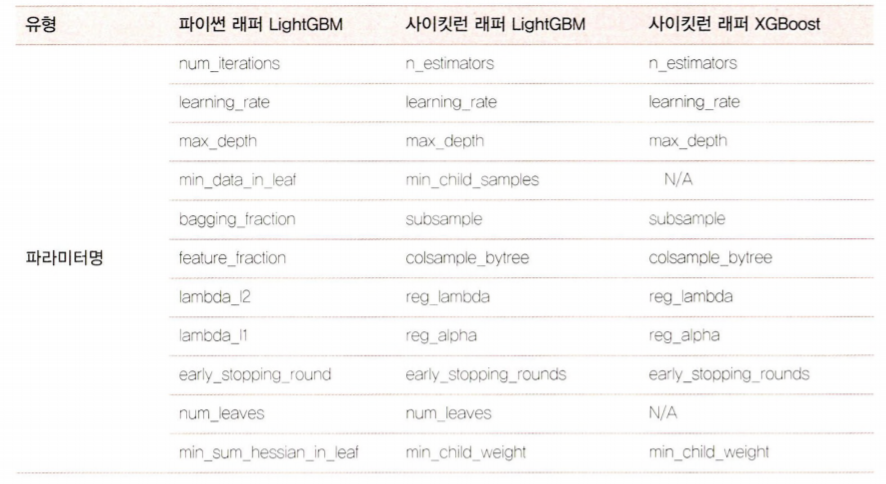

***LightGBM 적용 – 위스콘신 Breast Cancer Prediction***

In [20]:
# LightGBM의 파이썬 패키지인 lightgbm에서 LGBMClassifier 임포트
from lightgbm import LGBMClassifier

import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

dataset = load_breast_cancer()
ftr = dataset.data
target = dataset.target

# 전체 데이터 중 80%는 학습용 데이터, 20%는 테스트용 데이터 추출
X_train, X_test, y_train, y_test=train_test_split(ftr, target, test_size=0.2, random_state=156 )

# 앞서 XGBoost와 동일하게 n_estimators는 400 설정. 
lgbm_wrapper = LGBMClassifier(n_estimators=400)

# LightGBM도 XGBoost와 동일하게 조기 중단 수행 가능. 
evals = [(X_test, y_test)]
lgbm_wrapper.fit(X_train, y_train, early_stopping_rounds=100, eval_metric="logloss", 
                 eval_set=evals, verbose=True)
preds = lgbm_wrapper.predict(X_test)
pred_proba = lgbm_wrapper.predict_proba(X_test)[:, 1]

[1]	valid_0's binary_logloss: 0.565079
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.507451
[3]	valid_0's binary_logloss: 0.458489
[4]	valid_0's binary_logloss: 0.417481
[5]	valid_0's binary_logloss: 0.385507
[6]	valid_0's binary_logloss: 0.355846
[7]	valid_0's binary_logloss: 0.330897
[8]	valid_0's binary_logloss: 0.306923
[9]	valid_0's binary_logloss: 0.28776
[10]	valid_0's binary_logloss: 0.26917
[11]	valid_0's binary_logloss: 0.250954
[12]	valid_0's binary_logloss: 0.23847
[13]	valid_0's binary_logloss: 0.225865
[14]	valid_0's binary_logloss: 0.215076
[15]	valid_0's binary_logloss: 0.205996
[16]	valid_0's binary_logloss: 0.196091
[17]	valid_0's binary_logloss: 0.186395
[18]	valid_0's binary_logloss: 0.17942
[19]	valid_0's binary_logloss: 0.174727
[20]	valid_0's binary_logloss: 0.168563
[21]	valid_0's binary_logloss: 0.165432
[22]	valid_0's binary_logloss: 0.160356
[23]	valid_0's binary_logloss: 0.155508
[24]	valid_0's binary_logloss: 

In [21]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score

def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix( y_test, pred)
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

In [22]:
get_clf_eval(y_test, preds, pred_proba)

오차 행렬
[[33  4]
 [ 2 75]]
정확도: 0.9474, 정밀도: 0.9494, 재현율: 0.9740,    F1: 0.9615, AUC:0.9926


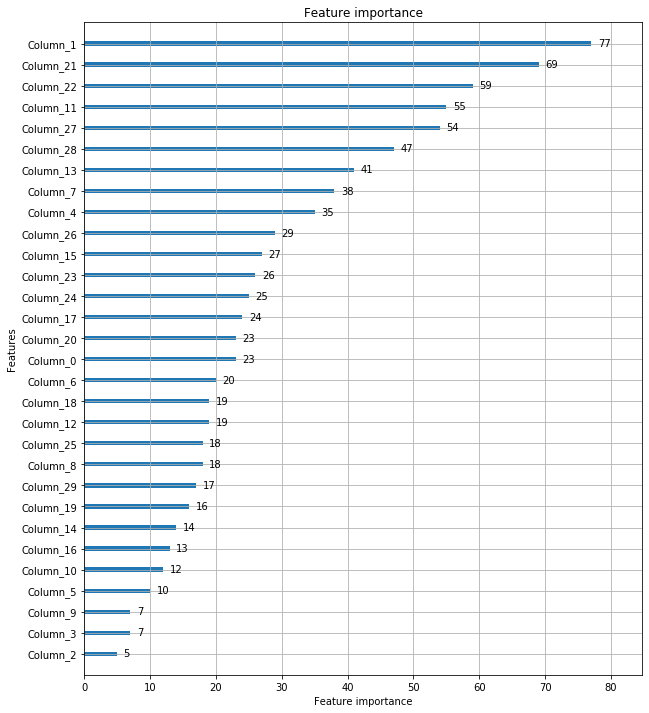

In [23]:
# plot_importance( )를 이용하여 feature 중요도 시각화
from lightgbm import plot_importance
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(figsize=(10, 12))
plot_importance(lgbm_wrapper, ax=ax)

---

### 08. 분류 실습 - 캐글 산탄데르 고객 만족 예측
[https://github.com/wikibook/pymldg-rev/blob/master/4%EC%9E%A5/4.8%20%EB%B6%84%EB%A5%98%EC%8B%A4%EC%8A%B5%20_%20%EC%82%B0%ED%83%84%EB%8D%B0%EB%A5%B4%20%EA%B3%A0%EA%B0%9D%20%EB%A7%8C%EC%A1%B1%20%EC%98%88%EC%B8%A1.ipynb]

In [26]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib

cust_df = pd.read_csv("C:\\Users\\Administrator\\Downloads\\santander-customer-satisfaction\\train_santander.csv", encoding = "cp949", engine = "python")

In [27]:
print('dataset shape:', cust_df.shape)
cust_df.head(3)

dataset shape: (76020, 371)


,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.17,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.03,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.77,0


In [28]:
print(cust_df['TARGET'].value_counts())
unsatisfied_cnt = cust_df[cust_df['TARGET'] == 1].TARGET.count()
total_cnt = cust_df.TARGET.count()
print('unsatisfied 비율은 {0:.2f}'.format((unsatisfied_cnt / total_cnt)))

0    73012
1     3008
Name: TARGET, dtype: int64
unsatisfied 비율은 0.04


In [29]:
cust_df.describe( )

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
count,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,...,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,76020.000000
mean,75964.050723,-1523.199277,33.212865,86.208265,72.363067,119.529632,3.559130,6.472698,0.412946,0.567352,...,7.935824,1.365146,12.215580,8.784074,31.505324,1.858575,76.026165,56.614351,1.172358e+05,0.039569
std,43781.947379,39033.462364,12.956486,1614.757313,339.315831,546.266294,93.155749,153.737066,30.604864,36.513513,...,455.887218,113.959637,783.207399,538.439211,2013.125393,147.786584,4040.337842,2852.579397,1.826646e+05,0.194945
min,1.000000,-999999.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.163750e+03,0.000000
25%,38104.750000,2.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.787061e+04,0.000000
50%,76043.000000,2.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.064092e+05,0.000000
75%,113748.750000,2.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.187563e+05,0.000000
max,151838.000000,238.000000,105.000000,210000.000000,12888.030000,21024.810000,8237.820000,11073.570000,6600.000000,6600.000000,...,50003.880000,20385.720000,138831.630000,91778.730000,438329.220000,24650.010000,681462.900000,397884.300000,2.203474e+07,1.000000


In [30]:
# var3 피처 값 대체 및 ID 피처 드롭
cust_df['var3'].replace(-999999,2, inplace=True)
cust_df.drop('ID',axis=1 , inplace=True)

# 피처 세트와 레이블 세트분리. 레이블 컬럼은 DataFrame의 맨 마지막에 위치해 컬럼 위치 -1로 분리
X_features = cust_df.iloc[:, :-1]
y_labels = cust_df.iloc[:, -1]
print('피처 데이터 shape:{0}'.format(X_features.shape))

피처 데이터 shape:(76020, 369)


In [31]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels,
                                                    test_size=0.2, random_state=0)
train_cnt = y_train.count()
test_cnt = y_test.count()
print('학습 세트 Shape:{0}, 테스트 세트 Shape:{1}'.format(X_train.shape , X_test.shape))

print(' 학습 세트 레이블 값 분포 비율')
print(y_train.value_counts()/train_cnt)
print('\n 테스트 세트 레이블 값 분포 비율')
print(y_test.value_counts()/test_cnt)

학습 세트 Shape:(60816, 369), 테스트 세트 Shape:(15204, 369)
 학습 세트 레이블 값 분포 비율
0    0.960964
1    0.039036
Name: TARGET, dtype: float64

 테스트 세트 레이블 값 분포 비율
0    0.9583
1    0.0417
Name: TARGET, dtype: float64


In [32]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

# n_estimators는 500으로, random state는 예제 수행 시마다 동일 예측 결과를 위해 설정. 
xgb_clf = XGBClassifier(n_estimators=500, random_state=156)

# 성능 평가 지표를 auc로, 조기 중단 파라미터는 100으로 설정하고 학습 수행. 
xgb_clf.fit(X_train, y_train, early_stopping_rounds=100,
            eval_metric="auc", eval_set=[(X_train, y_train), (X_test, y_test)])

xgb_roc_score = roc_auc_score(y_test, xgb_clf.predict_proba(X_test)[:,1],average='macro')
print('ROC AUC: {0:.4f}'.format(xgb_roc_score))

[0]	validation_0-auc:0.799928	validation_1-auc:0.803548
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 100 rounds.
[1]	validation_0-auc:0.802222	validation_1-auc:0.805222
[2]	validation_0-auc:0.80819	validation_1-auc:0.813162
[3]	validation_0-auc:0.8127	validation_1-auc:0.813243
[4]	validation_0-auc:0.81648	validation_1-auc:0.816979
[5]	validation_0-auc:0.816018	validation_1-auc:0.816629
[6]	validation_0-auc:0.816474	validation_1-auc:0.817776
[7]	validation_0-auc:0.818148	validation_1-auc:0.818464
[8]	validation_0-auc:0.81806	validation_1-auc:0.818295
[9]	validation_0-auc:0.817039	validation_1-auc:0.818087
[10]	validation_0-auc:0.818318	validation_1-auc:0.818749
[11]	validation_0-auc:0.818711	validation_1-auc:0.818521
[12]	validation_0-auc:0.818673	validation_1-auc:0.818516
[13]	validation_0-auc:0.819156	validation_1-auc:0.818998
[14]	validation_0-auc:0.819847	validation_1-auc:0.81999
[15

[142]	validation_0-auc:0.861553	validation_1-auc:0.841335
[143]	validation_0-auc:0.861682	validation_1-auc:0.841346
[144]	validation_0-auc:0.86169	validation_1-auc:0.841403
[145]	validation_0-auc:0.861852	validation_1-auc:0.841299
[146]	validation_0-auc:0.861898	validation_1-auc:0.841301
[147]	validation_0-auc:0.861998	validation_1-auc:0.841289
[148]	validation_0-auc:0.862068	validation_1-auc:0.84135
[149]	validation_0-auc:0.862132	validation_1-auc:0.841444
[150]	validation_0-auc:0.862236	validation_1-auc:0.841409
[151]	validation_0-auc:0.862314	validation_1-auc:0.841459
[152]	validation_0-auc:0.862584	validation_1-auc:0.841456
[153]	validation_0-auc:0.862843	validation_1-auc:0.841483
[154]	validation_0-auc:0.863033	validation_1-auc:0.841493
[155]	validation_0-auc:0.863132	validation_1-auc:0.841534
[156]	validation_0-auc:0.863423	validation_1-auc:0.841728
[157]	validation_0-auc:0.863578	validation_1-auc:0.841712
[158]	validation_0-auc:0.863872	validation_1-auc:0.841677
[159]	validation

In [ ]:
from sklearn.model_selection import GridSearchCV

# 하이퍼 파라미터 테스트의 수행 속도를 향상시키기 위해 n_estimators를 100으로 감소
xgb_clf = XGBClassifier(n_estimators=100)

params = {'max_depth':[5, 7] , 'min_child_weight':[1,3] ,'colsample_bytree':[0.5, 0.75] }

# cv는 3으로 지정 
gridcv = GridSearchCV(xgb_clf, param_grid=params, cv=3)
gridcv.fit(X_train, y_train, early_stopping_rounds=30, eval_metric="auc",
           eval_set=[(X_train, y_train), (X_test, y_test)])

print('GridSearchCV 최적 파라미터:',gridcv.best_params_) 

xgb_roc_score = roc_auc_score(y_test, gridcv.predict_proba(X_test)[:,1], average='macro')
print('ROC AUC: {0:.4f}'.format(xgb_roc_score))

In [ ]:
# n_estimators는 1000으로 증가시키고, learning_rate=0.02로 감소, reg_alpha=0.03으로 추가함. 
xgb_clf = XGBClassifier(n_estimators=1000, random_state=156, learning_rate=0.02, max_depth=7,\
                        min_child_weight=1, colsample_bytree=0.75, reg_alpha=0.03)

# evaluation metric을 auc로, early stopping은 200 으로 설정하고 학습 수행. 
xgb_clf.fit(X_train, y_train, early_stopping_rounds=200, 
            eval_metric="auc",eval_set=[(X_train, y_train), (X_test, y_test)])

xgb_roc_score = roc_auc_score(y_test, xgb_clf.predict_proba(X_test)[:,1],average='macro')
print('ROC AUC: {0:.4f}'.format(xgb_roc_score))

In [ ]:

from xgboost import plot_importance
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,1,figsize=(10,8))
plot_importance(xgb_clf, ax=ax , max_num_features=20,height=0.4)

***LightGBM 모델 학습과 하이퍼 파라미터 튜닝***

In [ ]:
from lightgbm import LGBMClassifier

lgbm_clf = LGBMClassifier(n_estimators=500)

evals = [(X_test, y_test)]
lgbm_clf.fit(X_train, y_train, early_stopping_rounds=100, eval_metric="auc", eval_set=evals,
                verbose=True)

lgbm_roc_score = roc_auc_score(y_test, lgbm_clf.predict_proba(X_test)[:,1],average='macro')
print('ROC AUC: {0:.4f}'.format(lgbm_roc_score))

In [ ]:
from sklearn.model_selection import GridSearchCV

# 하이퍼 파라미터 테스트의 수행 속도를 향상시키기 위해 n_estimators를 100으로 감소
lgbm_clf = LGBMClassifier(n_estimators=200)

params = {'num_leaves': [32, 64 ],
          'max_depth':[128, 160],
          'min_child_samples':[60, 100],
          'subsample':[0.8, 1]}


# cv는 3으로 지정 
gridcv = GridSearchCV(lgbm_clf, param_grid=params, cv=3)
gridcv.fit(X_train, y_train, early_stopping_rounds=30, eval_metric="auc",
           eval_set=[(X_train, y_train), (X_test, y_test)])

print('GridSearchCV 최적 파라미터:', gridcv.best_params_)
lgbm_roc_score = roc_auc_score(y_test, gridcv.predict_proba(X_test)[:,1], average='macro')
print('ROC AUC: {0:.4f}'.format(lgbm_roc_score))

In [ ]:
lgbm_clf = LGBMClassifier(n_estimators=1000, num_leaves=32, sumbsample=0.8, min_child_samples=100,
                          max_depth=128)

evals = [(X_test, y_test)]
lgbm_clf.fit(X_train, y_train, early_stopping_rounds=100, eval_metric="auc", eval_set=evals,
                verbose=True)

lgbm_roc_score = roc_auc_score(y_test, lgbm_clf.predict_proba(X_test)[:,1],average='macro')
print('ROC AUC: {0:.4f}'.format(lgbm_roc_score))

---

***09. 분류 실습 - 캐글 신용카드 사기 검출***
[https://github.com/wikibook/pymldg-rev/blob/master/4%EC%9E%A5/4.9%20%EB%B6%84%EB%A5%98%20%EC%8B%A4%EC%8A%B5-%EC%8B%A0%EC%9A%A9%EC%B9%B4%EB%93%9C_%EC%82%AC%EA%B8%B0%EA%B2%80%EC%B6%9C.ipynb]

***언더 샘플링과 오버 샘플링의 이해***

레이블이 불균형한 분포를 가진 데이터 세트를 학습시킬 때 예측 성능의 문제가 발생할 수 있는데, 이는 이상 레이블을 가지는 데이터 건수가 정상 레이블을 가진 데이터 건수에 비해 너무 적기 때문에 발생.<br>
지도학습에서 극도로 불균형한
레이블 값 분포로 인한 문제점을 해결하기 위해서는 적절한 학습 데이터를 확보하는 방안이 필요한데.
대표적으로. 오버 샘플링(Oversampling)과 언더 샘플링(Unclersampling) 방법이 있으며. 오버 샘플링 방식이 예측 성능상 더 유리한 경우가 많아 주로 사용됨.
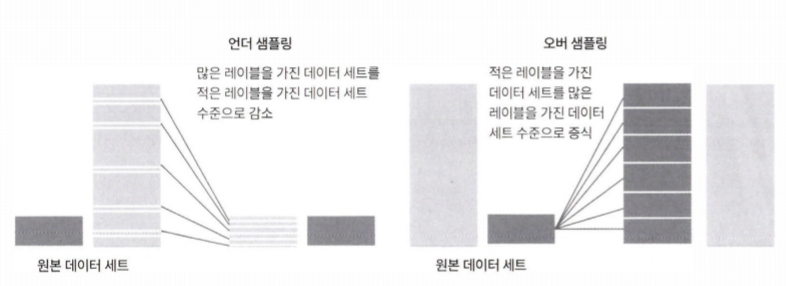
* 언더 샘플링 : 정상 레이블 데이터를 이상 레이블 데이터 수준으로 줄여 버린 상태에서 학습을 수행하면 과도하게 정상 레이블로 학습/예측하는 부작용을 개선할 수 있지만, 너무 많은 정상 레이블 데이터를 감소시키기 때문에 정상 레이블의 경우 오히려 제대로 된 학습을 수행할 수 없다는 단점이 있어 잘 적용하지 않는 방법
* 오버 샘플링 : 동일한 데이터를 단순히 증식하는 방법은 과적합(OverfiHing)이 되기 때문에 의미가 없으므로 원본 데이터의 피처 값들을 아주 약간만 변경하여 증식. 대표적으로 SMOTE(Synthetic Minority Oversampling Technique) 방법. SMOTE는 적은 데이터 세트에 있는 개별 데이터들의 K 최근접 이웃(K Nearest Neighbor)을 찾아서 이 데이터와 K개 이웃들의 차이를 일정 값으로 만들어서 기존 데이터와 약간 차이가 나는 새로운 데이터들을 생성하는 방식.
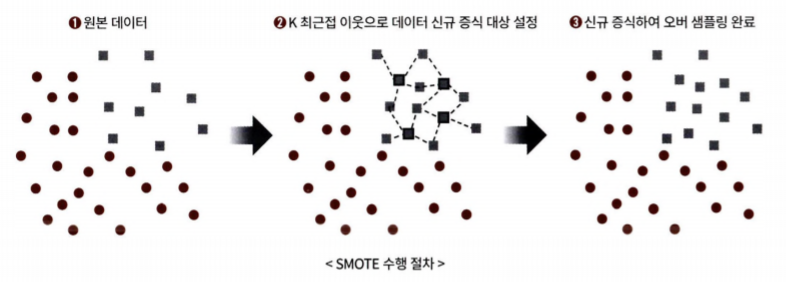
SMOTE를 구현한 대표적인 파이썬 패키지는 imbalanced-learn

---

### 10. 스태킹 앙상블

스태킹(Stacking)은 개별적인 여러 알고리즘을 서로 결합해 예측 결과를 도출한다는 점에서 앞에 소개
한 배깅(Bagging) 및 부스팅(Boosting)과 공통점을 가지고 있다. 하지만 가장 큰 차이점은 개별
알고리즘으로 예측한 데이터를 기반으로 다시 예측을 수행한다는 것. 즉, 개별 알고리즘의 예측
결과 데이터 세트를 최종적인 메타 데이터 세트로 만들어 별도의 ML 알고리즘으로 최종 학습을 수행하
고 테스트 데이터를 기반으로 다시 최종 예측을 수행하는 방식(이렇게 개별 모델의 예측된 데이
터 세트를 다시 기반으로 하여 학습하고 예측하는 방식을 메타 모델이라고 한다).<br>
스태킹 모델은 두 종류의 모델이 필요
* 첫 번째는 개별적인 기반 모델이고, 두 번째 이 개별 기반모델의 예측 데이터를 학습 데이터로 만들어서 학습하는 최종 메타 모델
스태킹 모델의 핵심은
여러 개별 모델의 예측 데이터를 각각 스태킹 형태로 결합해 최종 메타 모델의 학습용 피처 데이터 세트와 테스트용 피처 데이터 세트를 만드는 것.
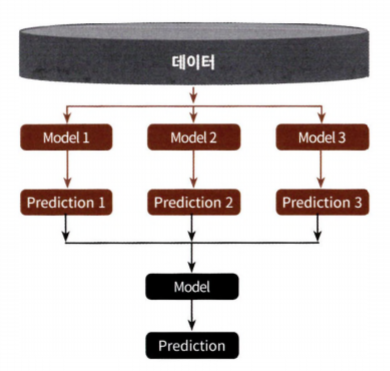

*예제*
M개의 로우. N개의 피처（칼럼）을 가진 데이터 세트에 스태킹 앙상블을 적용한다고 가정.
그리고 학습에 사용할 ML 알고리즘 모델은 모두 3개.
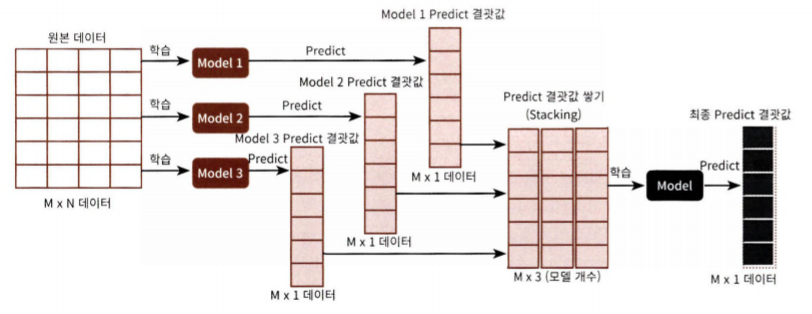


***기본 스태킹 모델***

In [33]:
import numpy as np

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

cancer_data = load_breast_cancer()

X_data = cancer_data.data
y_label = cancer_data.target

X_train , X_test , y_train , y_test = train_test_split(X_data , y_label , test_size=0.2 , random_state=0)

In [34]:

# 개별 ML 모델을 위한 Classifier 생성.
knn_clf  = KNeighborsClassifier(n_neighbors=4)
rf_clf = RandomForestClassifier(n_estimators=100, random_state=0)
dt_clf = DecisionTreeClassifier()
ada_clf = AdaBoostClassifier(n_estimators=100)

# 최종 Stacking 모델을 위한 Classifier생성. 
lr_final = LogisticRegression(C=10)

In [35]:
# 개별 모델들을 학습. 
knn_clf.fit(X_train, y_train)
rf_clf.fit(X_train , y_train)
dt_clf.fit(X_train , y_train)
ada_clf.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [36]:
# 학습된 개별 모델들이 각자 반환하는 예측 데이터 셋을 생성하고 개별 모델의 정확도 측정. 
# 개별 모델은 KNN, 랜덤 포레스트. 결정 트리, 에이다부스트이며, 
# 이들 모델의 예측 결과를 합한 데이터 세트로 학습/예측하는 최종 모델은 로지스틱 회귀
knn_pred = knn_clf.predict(X_test)
rf_pred = rf_clf.predict(X_test)
dt_pred = dt_clf.predict(X_test)
ada_pred = ada_clf.predict(X_test)

print('KNN 정확도: {0:.4f}'.format(accuracy_score(y_test, knn_pred)))
print('랜덤 포레스트 정확도: {0:.4f}'.format(accuracy_score(y_test, rf_pred)))
print('결정 트리 정확도: {0:.4f}'.format(accuracy_score(y_test, dt_pred)))
print('에이다부스트 정확도: {0:.4f} :'.format(accuracy_score(y_test, ada_pred)))

KNN 정확도: 0.9211
랜덤 포레스트 정확도: 0.9649
결정 트리 정확도: 0.9123
에이다부스트 정확도: 0.9561 :


In [37]:
pred = np.array([knn_pred, rf_pred, dt_pred, ada_pred])
print(pred.shape)

# transpose를 이용해 행과 열의 위치 교환. 컬럼 레벨로 각 알고리즘의 예측 결과를 피처로 만듦. 
pred = np.transpose(pred)
print(pred.shape)

(4, 114)
(114, 4)


In [38]:
lr_final.fit(pred, y_test)
final = lr_final.predict(pred)

print('최종 메타 모델의 예측 정확도: {0:.4f}'.format(accuracy_score(y_test , final)))

최종 메타 모델의 예측 정확도: 0.9649


=> 개별 모델의 예측 데이터를 스태킹으로 재구성해 최종 메타 모델에서 학습하고 예측한 결과, 정확도가
97.37%로 개별 모델 정확도보다 향상되었습니다(물론 이러한 스태킹 기법으로 예측을 한다고 무조건
개별 모델보다는 좋아진다는 보장은 없습니다)

***CV 세트 기반의 스태킹***

cv 세트 기반의 스태킹 모델은 과적합을 개선하기 위해 최종 메타 모델을 위한 데이터 세트를 만들 때
교차 검증 기반으로 예측된 결과 데이터 세트를 이용. 앞 예제에서 마지막에 메타 모델인 로지스틱 회귀 모델 기반에서 최종 학습할 때 레이블 데이터 세트로 학습 데이터가 아닌 테스트용 레이블 데이터 세트를 기반으로 학습했기에 과적합 문제가 발생할 수 있다.

CV 세트 기반의 스태킹은 이에 대한 개선을 위해 개별 모델들이 각각 교차 검증으로 메타 모델을 위한
학습용 스태킹 데이터 생성과 예측을 위한 테스트용 스태킹 데이터를 생성한 뒤 이를 기반으로 메타 모델이 학습과 예측을 수행
* 스텝 1： 각 모델별로 원본 학습/테스트 데이터를 예측한 결과 값을 기반으로 메타 모델을 위한 학습용/테스트용 데이터를 생성합니다.
> * 개별 모델 레벨에서 수
행하는 것이며. 이러한 로직을 여러 개의 개별 모델에서 동일하게 수행<br>먼저 학습용 데이터를 N개의 폴드(Fold)로 나눕니다. 여기서는 3개의 폴드세트로 가정.
3개의 폴드세트이므로 3번의 유사한 반복 작업을 수행하고, 마지막 3번째 반복에서 개별 모델의 예측값으로 학습 데이터와 테스트 데이터를 생성
> * 주요 프로세스 
>> ① 학습용 데이
터를 3개의 폴드로 나누되, 2개의 폴드는 학습을 위한 데이터 폴드로, 나머지 1개의 폴드는 검증을 위
한 데이터 폴드로 나눕니다. 이렇게 두 개의 폴드로 나뉜 학습 데이터를 기반으로 개별 모델을 학습시
킵니다. 
>> ② 이렇게 학습된 개별 모델은 검증 폴드 1개 데이터로 예측하고 그 결과를 저장합니다. 이러
한 로직을 3번 반복하면서 학습 데이터와 검증 데이터 세트를 변경해가면서 학습 후 예측 결과를 별도
로 저장합니다. 이렇게 만들어진 예측 데이터는 메타 모델을 학습시키는 학습 데이터로 사용됩니다.
>>  ③ 한편 2개의 학습 폴드 데이터로 학습된 개별 모델은 원본 테스트 데이터를 예측하여 예측값을 생성합
니다. 마찬가지로 이러한 로직을 3번 반복하면서 이 예측값의 평균으로 최종 결괏값을 생성하고 이를
메타 모델을 위한 테스트 데이터로 사용합니다. 
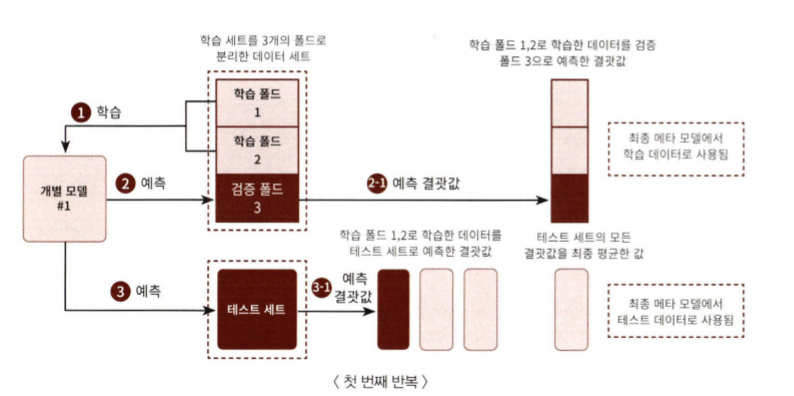
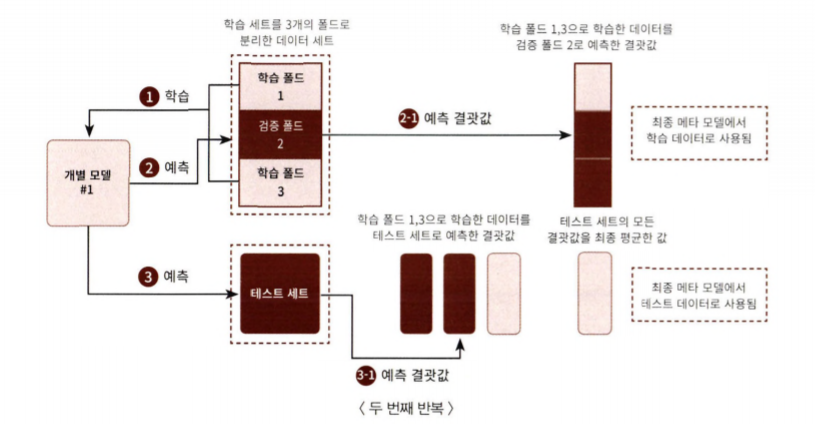
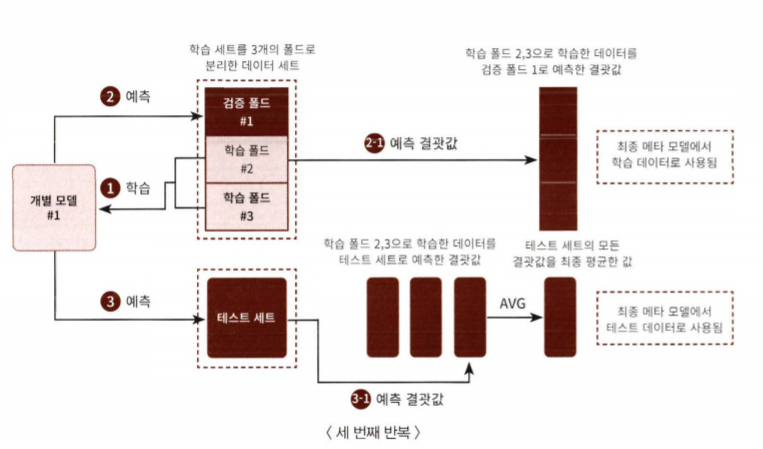

* 스텝2： 스텝 1에서 개별 모델들이 생성한 학습용 데이터를 모두 스태킹 형태로 합쳐서 메타 모델이 학습할 최종 학습용 데이터 세트를 생성합니다. 마찬가지로 각 모델들이 생성한 테스트용 데이터를 모두 스태킹 형태로 합쳐서 메타 모델이 예측할 최종 테스트 데이트 세트를 생성합니다. 메타 모델은 최종적으로 생성된 학습 데이터 세트와 원본 학습 데이터의 레이블 데이터를 기반으로 학습한 뒤, 최종적으로 생성된 테스트 데이터 세트를 예측하고、원본 테스트 데이터의 레이블 데이터를 기반으로 평가합니다
> 각 모델들이 스텝 1로
생성한 학습과 테스트 데이터를 모두 합쳐서 최종적으로 메타 모델이 사용할 학습 데이터와 테스트 데이터를 생성하기만 하면 됨. 메타 모델이 사용할 최종 학습 데이터와 원본 데이터의 레이블 데이터를 합쳐서 메타 모델을 학습한 후에 최종 테스트 데이터로 예측을 수행 한 뒤. 최종 예측 결과를 원본
테스트 데이터의 레이블 데이터와 비교해 평가하면 된다.
> *  스텝 2를 포함해 CV 기반의 스태킹 모델 전체를 도식화한 그림
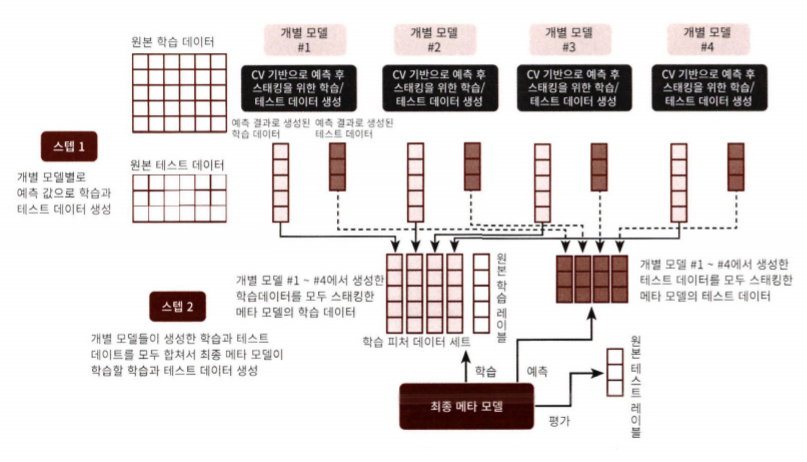

In [39]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error

# 개별 기반 모델에서 최종 메타 모델이 사용할 학습 및 테스트용 데이터를 생성하기 위한 함수. 
def get_stacking_base_datasets(model, X_train_n, y_train_n, X_test_n, n_folds ):
    # 지정된 n_folds값으로 KFold 생성.
    kf = KFold(n_splits=n_folds, shuffle=False, random_state=0)
    #추후에 메타 모델이 사용할 학습 데이터 반환을 위한 넘파이 배열 초기화 
    train_fold_pred = np.zeros((X_train_n.shape[0] ,1 ))
    test_pred = np.zeros((X_test_n.shape[0],n_folds))
    print(model.__class__.__name__ , ' model 시작 ')
        
    for folder_counter , (train_index, valid_index) in enumerate(kf.split(X_train_n)):
        #입력된 학습 데이터에서 기반 모델이 학습/예측할 폴드 데이터 셋 추출 
        print('\t 폴드 세트: ',folder_counter,' 시작 ')
        X_tr = X_train_n[train_index] 
        y_tr = y_train_n[train_index] 
        X_te = X_train_n[valid_index]  
        
        #폴드 세트 내부에서 다시 만들어진 학습 데이터로 기반 모델의 학습 수행.
        model.fit(X_tr , y_tr)       
        #폴드 세트 내부에서 다시 만들어진 검증 데이터로 기반 모델 예측 후 데이터 저장.
        train_fold_pred[valid_index, :] = model.predict(X_te).reshape(-1,1)
        #입력된 원본 테스트 데이터를 폴드 세트내 학습된 기반 모델에서 예측 후 데이터 저장. 
        test_pred[:, folder_counter] = model.predict(X_test_n)
            
    # 폴드 세트 내에서 원본 테스트 데이터를 예측한 데이터를 평균하여 테스트 데이터로 생성 
    test_pred_mean = np.mean(test_pred, axis=1).reshape(-1,1)    
    
    #train_fold_pred는 최종 메타 모델이 사용하는 학습 데이터, test_pred_mean은 테스트 데이터
    return train_fold_pred , test_pred_mean

In [40]:
knn_train, knn_test = get_stacking_base_datasets(knn_clf, X_train, y_train, X_test, 7)
rf_train, rf_test = get_stacking_base_datasets(rf_clf, X_train, y_train, X_test, 7)
dt_train, dt_test = get_stacking_base_datasets(dt_clf, X_train, y_train, X_test,  7)    
ada_train, ada_test = get_stacking_base_datasets(ada_clf, X_train, y_train, X_test, 7)

KNeighborsClassifier  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
	 폴드 세트:  5  시작 
	 폴드 세트:  6  시작 
RandomForestClassifier  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
	 폴드 세트:  5  시작 
	 폴드 세트:  6  시작 
DecisionTreeClassifier  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
	 폴드 세트:  5  시작 
	 폴드 세트:  6  시작 
AdaBoostClassifier  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
	 폴드 세트:  5  시작 
	 폴드 세트:  6  시작 


In [41]:
# 메타 모델이 학습할 학습용 피처 데이터 세트 & 메타 모델이 예측할 테스트용 피처 데이터 세트
Stack_final_X_train = np.concatenate((knn_train, rf_train, dt_train, ada_train), axis=1)
Stack_final_X_test = np.concatenate((knn_test, rf_test, dt_test, ada_test), axis=1)
print('원본 학습 피처 데이터 Shape:',X_train.shape, '원본 테스트 피처 Shape:',X_test.shape)
print('스태킹 학습 피처 데이터 Shape:', Stack_final_X_train.shape,
      '스태킹 테스트 피처 데이터 Shape:',Stack_final_X_test.shape)

원본 학습 피처 데이터 Shape: (455, 30) 원본 테스트 피처 Shape: (114, 30)
스태킹 학습 피처 데이터 Shape: (455, 4) 스태킹 테스트 피처 데이터 Shape: (114, 4)


In [42]:
lr_final.fit(Stack_final_X_train, y_train)
stack_final = lr_final.predict(Stack_final_X_test)

print('최종 메타 모델의 예측 정확도: {0:.4f}'.format(accuracy_score(y_test, stack_final)))

최종 메타 모델의 예측 정확도: 0.9737


=> 지금까지의 예제에서는 개별 모델의 알고리즘에서 파라미터 튜닝을 최적으로 하지 않았지만. 스태킹을 이루는 모델은 최적으로 파라미터를
튜닝한 상태에서 스태킹 모델을 만드는 것이 일반적

 일반적으로
스태킹 모델의 파라미터 튜닝은 개별 알고리즘 모델의 파라미터를 최적으로 튜닝하는 것을 말한다.
스태킹 모델은 분류(Classification)뿐만 아니라 회귀(Regression)에도 적용 가능하다.

---

### 11. 정리

대부분의 앙상블 기법은 결정 트리 기반의 다수의 약한 학습기(Weak Learner)를 결합해 변동성을
줄여 예측 오류를 줄이고 성능을 개선하고 있습니다. 
* 결정 트리 알고리즘은 정보의 균일도에 기반한 규칙 트리를 만들어서 예측을 수행합니다. 결정 트리는 다른 알고리즘에 비해 비교적 직관적이어서 어떻게 예측 결과가 도출되었는지 그 과정을 쉽게 알 수 있습니다. 결정 트리의 단점으로는 균일한 최종 예측 결과를 도출하기 위해 결정 트리가 깊어지고 복잡해 지면서 과적합이 쉽게 발생하는 것입니다.
* 앙상블 기법은 대표적으로 배깅과 부스팅으로 구분될 수 있으며, 배깅 방식은 학습 데이터를 중복을 허용하면서 다수의 세트로 샘플링하여 이를 다수의 약한 학습기가 학습한 뒤 최종 결과를 결합해 예측하는 방식입니다. 대표적인 배깅 방식은 랜덤 포레스트입니다. 랜덤 포레스트는 수행시간이 빠르고 비교적 안정적인 예측 성능을 제공하는 훌륭한 머신러닝 알고리즘입니다.
* 현대의 앙상블 기법은 배깅보다는 부스팅이 더 주류를 이루고 있습니다. 부스팅은 학습기들이 순차적으로 학습을 진행하면서 예측이 틀린 데이터에 대해서는 가중치를 부여해 다음번 학습기가 학습할 때에는 이전에 예측이 틀린 데이터에 대해서는 보다 높은 정확도로 예측할 수 있도록 해줍니다. 부스팅의효시격인 GBM(Gradient Boosting Machine)은 뛰어난 예측 성능을 가졌지만, 수행 시간이 너무 오래 걸린다는 단점이 있습니다.
* XGBoost와 LightGBM은 현재 가장 각광을 받고 있는 부스팅 기반 머신러닝 패키지입니다. XGBoost의 경우 많은 캐글 경연대회에서 우승을 위한 알고리즘으로 불리면서 명성을 쌓아 왔으며, LightGBM 또한 XGBoost보다 빠른 학습 수행 시간에도 불구하고 XGBoost에 버금가는 예측 성능을 보유하고있습니다. XGBoost와 LightGBM 개발 그룹은 많은 사용자들이 애용하는 사이킷런과 XGBoost와 LightGBM이 쉽게 연동할 수 있도록 사이킷런 래퍼 클래스를 제공하고 있습니다. 이들 래퍼 클래스를 이용하면 사이킷런의 여타 다른 Estimator 클래스와 동일한 방식으로 사이킷런 기반의 머신러닝 애플리케이션을 더 쉽게 개발할 수 있습니다.
* 마지막으로 스태킹 모델을 살펴봤습니다. 스태킹은 여러 개의 개별 모델들이 생성한 예측 데이터를 기반으로 최종 메타 모델이 학습할 별도의 학습 데이터 세트와 예측할 테스트 데이터 세트를 재 생성하는 기법입니다. 스태킹 모델의 핵심은 바로 메타 모델이 사용할 학습 데이터 세트와 예측 데이터 세트를 개별 모델의 예측 값들을 스태킹 형대로 결합해 생성하는 데 있습니다.
